# Part 3. Preprocessing and Machine Learning

In [1]:
from utils import *

In [2]:
# Read in the data
tweet_stocks = pd.read_pickle('data/tweet_stocks_EDA.pkl')
plt.style.use('fivethirtyeight')

# Data Preprocessing

To get the text ready for machine learning, we will remove punctuation, stopwords, junkwords, and normalize the text by making it lowercase and lemmatizing it.

To extract features from the text, we are going to first clean it of any links, mentions, hashtags, and emojis to preserve the syntax of the tweet. We will be looking at two examples during this process.

We have two tweets from Elon Musk that made headlines for how they affected the stock. August 7th, 2018 caused stocks to jump and May 1st, 2020. Let's take a look at these tweets.

In [3]:
# Sample Text
sample = tweet_stocks[tweet_stocks['username'] == 'elonmusk']
sample['date'] = pd.to_datetime(sample['date'])
sample.set_index('date', inplace=True)

pd.options.display.max_colwidth = 1000
sample_increase = sample['2018-08-07']
sample_decrease = sample['2020-05-01']
sample_tweet_increase = sample_increase[['tweet', 'percent change']]
sample_tweet_decrease = sample_decrease[['tweet' ,'percent change']].reset_index().drop(0).set_index('date')
pct_increase = sample_tweet_increase['percent change'].values*100
pct_decrease = sample_tweet_decrease['percent change'].values*100
print('Tweet Increases Stock by {:.3f}%'.format(pct_increase[0]))
print('========================')
print(sample_tweet_increase[['tweet']].values[0][0], '\n')
print('Tweet Decreases Stock by {:.3f}%'.format(pct_decrease[0]))
print('========================')
print(sample_tweet_decrease[['tweet']].values[0][0])

Tweet Increases Stock by 10.391%
Investor support is confirmed. Only reason why this is not certain is that it’s contingent on a shareholder vote. @MindFieldMusic Def no forced sales. Hope all shareholders remain. Will be way smoother &amp; less disruptive as a private company. Ends negative propaganda from shorts. @thatspacegeek Yes, but liquidity events would be limited to every 6 months or so (like SpaceX) Shareholders could either to sell at 420 or hold shares &amp; go private @heydave7 Absolutely. Am super appreciative of Tesla shareholders. Will ensure their prosperity in any scenario. @Gfilche My hope is *all* current investors remain with Tesla even if we’re private. Would create special purpose fund enabling anyone to stay with Tesla. Already do this with Fidelity’s SpaceX investment. @EvotoRentals Yes @FredericLambert I don’t have a controlling vote now &amp; wouldn’t expect any shareholder to have one if we go private. I won’t be selling in either scenario. Good morning 😀 @L

Both twitter samples need to be cleaned, which needs to be able to conserve the context around the text.

In [4]:
tweet_stocks['text'] = tweet_stocks['tweet'].apply(lambda x: clean_text(x, preserve_syntax=True))

In [5]:
sample = tweet_stocks[tweet_stocks['username'] == 'elonmusk']
sample['date'] = pd.to_datetime(sample['date'])
sample.set_index('date', inplace=True)

sample_increase = sample['2018-08-07']
sample_decrease = sample['2020-05-01']
sample_tweet_increase = sample_increase[['text', 'percent change']]
sample_tweet_decrease = sample_decrease[['text' ,'percent change']].reset_index().drop(0).set_index('date')
pct_increase = sample_tweet_increase['percent change'].values*100
pct_decrease = sample_tweet_decrease['percent change'].values*100
print('Cleaned Tweet Increases Stock by {:.3f}%'.format(pct_increase[0]))
print('========================')
print(sample_tweet_increase[['text']].values[0][0], '\n')
print('Cleaned Tweet Decreases Stock by {:.3f}%'.format(pct_decrease[0]))
print('========================')
print(sample_tweet_decrease[['text']].values[0][0])

Cleaned Tweet Increases Stock by 10.391%
Investor support is confirmed. Only reason why this is not certain is that it is contingent on a shareholder vote. Def no forced sales. Hope all shareholders remain. Will be way smoother less disruptive as a private company. Ends negative propaganda from shorts. Yes, but liquidity events would be limited to every 6 months or so like SpaceX Shareholders could either to sell at 420 or hold shares go private Absolutely. Am super appreciative of Tesla shareholders. Will ensure their prosperity in any scenario. My hope is all current investors remain with Tesla even if we are private. Would create special purpose fund enabling anyone to stay with Tesla. Already do this with Fidelitys SpaceX investment. Yes I do not have a controlling vote now would not expect any shareholder to have one if we go private. I will not be selling in either scenario. Good morning 420 Am considering taking Tesla private at 420. Funding secured. 

Cleaned Tweet Decreases St

Apart from a few sentences lacking punctuation, the text itself is preserved including capitalization, which will aid in using Spacy's NLP toolkit to extract text features.

### Extracting Text Features

In [6]:
tweet_stocks['number of emojis'] = tweet_stocks['tweet'].apply(lambda x: emoji_counts(x))

In [7]:
nlp = spacy.load('en_core_web_lg')

In [8]:
# Remove empty tweets after cleaning

tweet_stocks['tweet length'] = tweet_stocks['text'].apply(lambda x: len(x))
tweet_stocks = tweet_stocks[tweet_stocks['tweet length'] != 0]
tweet_stocks.reset_index(inplace=True, drop=True)

In [9]:
%%time
# Clocked at 14min 20s
df = tweet_stocks.copy(deep=True)
text  = 'text'

df['number of sentences'] = df[text].apply(lambda x: num_sentences(x))
df['number of words'] = df[text].apply(lambda x: num_words(x))
df['avg words per sentence'] = df[text].apply(lambda x: avg_words_per_sentence(x))

count = df[text].apply(lambda x: noun_counts(x))
df['number of nouns'] = 0
for i in range(len(count)):
    df['number of nouns'].iloc[i] = count[i][0]

count = df[text].apply(lambda x: verb_counts(x))
df['number of verbs'] = 0
for i in range(len(count)):
    df['number of verbs'].iloc[i] = count[i][0]

count = df[text].apply(lambda x: stopword_counts(x))
df['number of stopwords'] = 0
for i in range(len(count)):
    df['number of stopwords'].iloc[i] = count[i][0]

count = df[text].apply(lambda x: org_counts(x))
df['number of organizations'] = 0
for i in range(len(count)):
    df['number of organizations'].iloc[i] = count[i][0]

CPU times: user 8min 51s, sys: 37.4 s, total: 9min 29s
Wall time: 9min 31s


In [10]:
tweet_stocks = df

In [11]:
STOP_WORDS = nlp.Defaults.stop_words

In [12]:
sample_increase['text']

date
2018-08-07 16:00:00    Investor support is confirmed. Only reason why this is not certain is that it is contingent on a shareholder vote. Def no forced sales. Hope all shareholders remain. Will be way smoother less disruptive as a private company. Ends negative propaganda from shorts. Yes, but liquidity events would be limited to every 6 months or so like SpaceX Shareholders could either to sell at 420 or hold shares go private Absolutely. Am super appreciative of Tesla shareholders. Will ensure their prosperity in any scenario. My hope is all current investors remain with Tesla even if we are private. Would create special purpose fund enabling anyone to stay with Tesla. Already do this with Fidelitys SpaceX investment. Yes I do not have a controlling vote now would not expect any shareholder to have one if we go private. I will not be selling in either scenario. Good morning 420 Am considering taking Tesla private at 420. Funding secured.
Name: text, dtype: object

In [13]:
sample_increase['cleaned'] = sample_increase['tweet'].apply(lambda x: clean_text(x, stop_words=STOP_WORDS))
sample_decrease['cleaned'] = sample_decrease['tweet'].apply(lambda x: clean_text(x, stop_words=STOP_WORDS))

In [14]:
sample_increase[['cleaned']]

,cleaned
date,
2018-08-07 16:00:00,investor support confirm reason certain contingent shareholder vote def force sale hope shareholder remain way smoother disruptive private company end negative propaganda short yes liquidity event limited month like spacex shareholder sell hold share private absolutely super appreciative tesla shareholder ensure prosperity scenario hope current investor remain tesla private create special purpose fund enable stay tesla fidelitys spacex investment yes control vote expect shareholder private selling scenario good morning consider take tesla private funding secure


In [15]:
sample_decrease[['cleaned']]

,cleaned
date,
2020-05-01 09:30:00,got exactly say need stop
2020-05-01 16:00:00,baby monday need cash devote mars earth possession weigh gf mad stipulation sale gene wilders old house tear lose soul rage rage die light consciousness exactly cheaply freedom sell land free home brave oh starspangled banner wave give proof night flag rocket red glare bomb burst air people freedom tesla stock price high go sell physical possession house incentive matter starship make good progress real


We can see from the cleaned text that there are going to be some words that won't be recognized. Let's look at all short words and see if they can be removed.

In [16]:
%%time
# Clocked at 3min 26s
tweet_stocks['cleaned'] = tweet_stocks['text'].apply(lambda x:clean_text(x, stop_words=STOP_WORDS))
tweet_stocks['len_cleaned'] = tweet_stocks['cleaned'].apply(lambda x: len(x))
tweet_stocks[tweet_stocks['len_cleaned'] == 0]

CPU times: user 1min 40s, sys: 3.17 s, total: 1min 43s
Wall time: 1min 44s


,date,tweet,username,mentions,hashtags,video,photos,urls,number of tweets,price,...,tweet length,number of sentences,number of words,avg words per sentence,number of nouns,number of verbs,number of stopwords,number of organizations,cleaned,len_cleaned
1282,2021-02-17 16:00:00,The Next ⁦@TIME⁩ 100. https://t.co/moS5ZsvZiO,Benioff,0.693147,0.000000,0.693147,0.000000,0.000000,0.693147,247.660004,...,13,1,2,3.0,0,0,2,0,,0
1285,2021-02-22 16:00:00,2021 @TIME NEXT 100 https://t.co/3UsgOGOKWH 2021 @TIME NEXT 100 https://t.co/s0QBQcqDch,Benioff,1.098612,0.000000,1.098612,1.098612,0.000000,1.098612,240.949997,...,29,2,2,3.0,0,0,2,0,,0
3580,2021-05-14 09:30:00,NO! https://t.co/INuchqGa60,JohnLegere,0.000000,0.000000,0.000000,0.000000,0.693147,0.693147,139.059998,...,3,1,1,1.0,0,0,1,0,,0
3841,2017-07-18 09:30:00,@DellyBeck y,elonmusk,0.000000,0.000000,0.000000,0.000000,0.000000,0.693147,63.500000,...,1,1,1,1.0,0,0,0,0,,0
3929,2017-12-07 16:00:00,@FortuneTech Do it,elonmusk,0.000000,0.000000,0.000000,0.000000,0.000000,0.693147,62.248001,...,5,1,2,2.0,0,1,2,0,,0
3933,2017-12-12 16:00:00,"35,000",elonmusk,0.000000,0.000000,0.000000,0.000000,0.000000,0.693147,68.206001,...,6,1,0,1.0,0,0,0,0,,0
3956,2018-01-30 16:00:00,15k,elonmusk,0.000000,0.000000,0.000000,0.000000,0.000000,0.693147,69.164001,...,3,1,1,1.0,1,0,0,0,,0
4017,2018-04-18 09:30:00,https://t.co/MMRtF3jHD5 https://t.co/JIl6vzhQAx https://t.co/dEOd5GKfdk Now https://t.co/4CLYzLR9mk,elonmusk,0.000000,0.000000,0.000000,0.000000,1.609438,1.609438,58.216000,...,5,1,1,1.0,0,0,0,0,,0
4020,2018-04-23 09:30:00,@MrAdamPrater Mostly not,elonmusk,0.000000,0.000000,0.000000,0.000000,0.000000,0.693147,58.257999,...,10,1,2,2.0,0,0,2,0,,0
4024,2018-04-27 09:30:00,https://t.co/3ZyzXoJjcc https://t.co/Er71Qz68Rh,elonmusk,0.000000,0.000000,0.000000,0.000000,1.098612,0.693147,57.074001,...,1,1,0,1.0,0,0,0,0,,0


In [17]:
tweet_stocks = tweet_stocks[tweet_stocks['len_cleaned'] != 0].drop('len_cleaned', axis=1).reset_index(drop=True)

In [18]:
all_text = " ".join(tweet_stocks['cleaned'])
orig_len = len(all_text)
small_words = [word for word in all_text.split() if len(word) <= 2]
small_words = set(small_words)

In [19]:
print(small_words)

{'dq', 'ty', 'nz', 'op', 'oz', 'sk', 'el', 'df', 'ep', 'ct', 'du', 'dp', 'vc', 'sd', 'bc', 'jo', 'ft', 'mo', 'ui', 'jj', 'mk', 'io', 'ha', 'gg', 'kt', 'pl', 'xl', 'hk', 'og', 'jc', 'fa', 'et', 'ks', 'vr', 'xr', 'bi', 'ae', 'hw', 'rp', 'tn', 'cn', 'sp', 'ex', 'kg', 'wh', 'ii', 'cv', 'va', 'ad', 'fb', 'fy', 'ur', 'bd', 'yc', 'jt', 'qa', 'go', 'ld', 'mt', 'qk', 'pe', 'ao', 'ig', 'jd', 'dj', 'ed', 'sc', 'ap', 'nb', 'ok', 'tf', 'gd', 'dd', 'rn', 'lr', 'vm', 'aw', 'ht', 'cb', 'ou', 'fm', 'de', 'mi', 'pb', 'kb', 'xx', 'ac', 'sa', 'da', 'mr', 'km', 'gf', 'ar', 'wy', 'ns', 'uh', 'tl', 'un', 'rd', 'gb', 'jp', 'bs', 'ah', 'yo', 'vz', 'nl', 'ya', 'dr', 'ir', 'ko', 'vp', 'uk', 'ox', 'dm', 'hm', 'fe', 'di', 'ho', 'ue', 'ip', 'zx', 'eh', 'pt', 'wo', 'hr', 'bk', 'wm', 'ia', 'sl', 'hz', 'tv', 'ag', 'bt', 'ie', 'mc', 'fp', 'wd', 'rh', 'ch', 'uc', 'os', 'pa', 'we', 'cj', 'ai', 'eo', 'cd', 'tw', 'vf', 'lp', 'pd', 'eg', 'nn', 'nj', 'ml', 'vx', 'ab', 'ts', 'gp', 'pj', 'ge', 'vw', 'st', 'ma', 'jk', 'fh', 'fi

Let's remove these

In [20]:
sample_decrease['cleaned'] = sample_decrease['cleaned'].apply(lambda x:" ".join([x for x in x.split() if x not in small_words]))

In [21]:
sample_increase[['cleaned']]

,cleaned
date,
2018-08-07 16:00:00,investor support confirm reason certain contingent shareholder vote def force sale hope shareholder remain way smoother disruptive private company end negative propaganda short yes liquidity event limited month like spacex shareholder sell hold share private absolutely super appreciative tesla shareholder ensure prosperity scenario hope current investor remain tesla private create special purpose fund enable stay tesla fidelitys spacex investment yes control vote expect shareholder private selling scenario good morning consider take tesla private funding secure


In [22]:
sample_decrease[['cleaned']]

,cleaned
date,
2020-05-01 09:30:00,got exactly say need stop
2020-05-01 16:00:00,baby monday need cash devote mars earth possession weigh mad stipulation sale gene wilders old house tear lose soul rage rage die light consciousness exactly cheaply freedom sell land free home brave starspangled banner wave give proof night flag rocket red glare bomb burst air people freedom tesla stock price high sell physical possession house incentive matter starship make good progress real


This looks like it works. Let's apply it over the whole dataframe.

In [23]:
tweet_stocks['cleaned'] = tweet_stocks['cleaned'].apply(lambda x:" ".join([x for x in x.split() if x not in small_words]))

Let's now look at infrequent words to see if we can remove any of them.

In [24]:
freq_words = pd.Series(all_text.split()).value_counts()
rare_words = freq_words[freq_words.values == 1]

In [25]:
print(rare_words)

dilbert            1
centaur            1
updone             1
blockbustercoin    1
lifeif             1
                  ..
yourwelcome        1
reasonyour         1
customerit         1
pointerlab         1
cady               1
Length: 14973, dtype: int64


A lot of these are misspellings and can be safely removed. 

In [26]:
tweet_stocks['cleaned'] = tweet_stocks['cleaned'].apply(lambda x:" ".join([x for x in x.split() if x not in rare_words]))

In [27]:
sample_increase[['cleaned']]

,cleaned
date,
2018-08-07 16:00:00,investor support confirm reason certain contingent shareholder vote def force sale hope shareholder remain way smoother disruptive private company end negative propaganda short yes liquidity event limited month like spacex shareholder sell hold share private absolutely super appreciative tesla shareholder ensure prosperity scenario hope current investor remain tesla private create special purpose fund enable stay tesla fidelitys spacex investment yes control vote expect shareholder private selling scenario good morning consider take tesla private funding secure


In [28]:
all_text = " ".join(tweet_stocks['cleaned'])
cleaned_len = len(all_text)

In [29]:
print('Original Text Length: {}'.format(orig_len))
print('Cleaned Text Length: {}'.format(cleaned_len))
print('Cleaned / Original: {:.2f}'.format(cleaned_len / orig_len))

Original Text Length: 2252834
Cleaned Text Length: 2086077
Cleaned / Original: 0.93


In [30]:
engineered_feat = ['number of emojis', 'tweet length', 'number of sentences',
       'number of words', 'avg words per sentence', 'number of nouns',
       'number of verbs', 'number of stopwords', 'number of organizations']

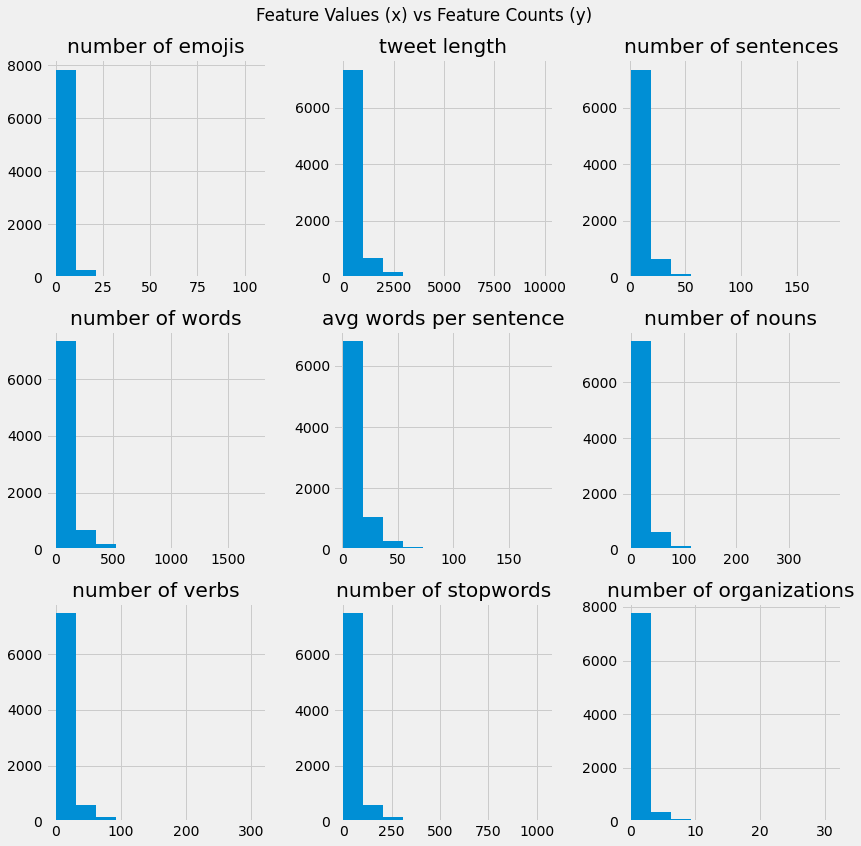

In [31]:
tweet_stocks[engineered_feat].hist(figsize=(12,12))
plt.suptitle('Feature Values (x) vs Feature Counts (y)')
plt.tight_layout()
plt.show()

In [32]:
tweet_stocks[engineered_feat] += 1
tweet_stocks[engineered_feat] = np.log(tweet_stocks[engineered_feat])

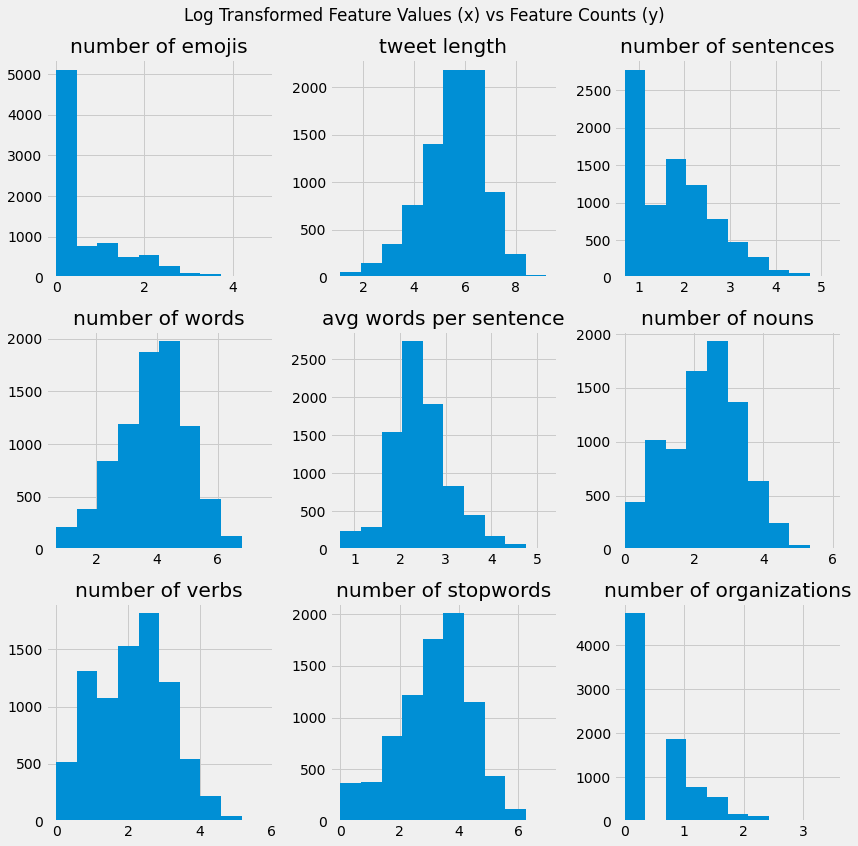

In [33]:
tweet_stocks[engineered_feat].hist(figsize=(12,12))
plt.suptitle('Log Transformed Feature Values (x) vs Feature Counts (y)')
plt.tight_layout()
plt.show()

# Save Pre-Processed Data and Prepare Features for Machine Learning

In [34]:
pd.to_pickle(tweet_stocks, './data/pre_processed_df.pkl')

In [35]:
save = pd.read_pickle('./data/pre_processed_df.pkl')

In [36]:
tweet_stocks = save

In [37]:
new_df = pd.DataFrame()
labels = ['move','stay', 'move']
for user in list(tweet_stocks['username'].unique()):
    df = tweet_stocks[tweet_stocks['username'] == user]
    bins = [df['percent change'].min(), -0.025, 0.025, df['percent change'].max()]
    df['movement'] = pd.cut(df['percent change'], bins=bins, labels=labels, include_lowest=True, ordered=False)
    new_df = new_df.append(df)
    new_df.reset_index(inplace=True, drop=True)
tweet_stocks = new_df 

<AxesSubplot:xlabel='percent change', ylabel='Count'>

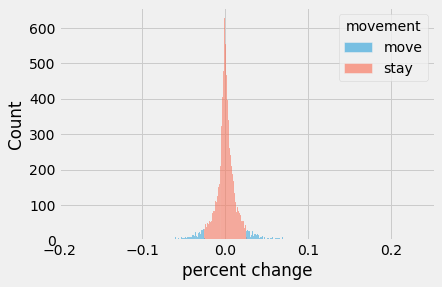

In [38]:
plt.style.use('fivethirtyeight')
sns.histplot(data=tweet_stocks, x='percent change', hue='movement')

In [39]:
df = tweet_stocks.copy(deep=True)

In [40]:
numerical_feat = [
    'mentions', 'hashtags',
       'video', 'photos', 'urls',
       'number of tweets',
       'number of emojis', 'tweet length', 'number of sentences',
       'number of words', 'avg words per sentence', 'number of nouns',
       'number of verbs', 'number of stopwords', 'number of organizations',
       ]
text_feat = ['tweet', 'text', 'cleaned']
targets = []
all_scores = {}
cv_scores = {}
models = {}

In [41]:
labels = ['stay', 'move']
col_name = 'bins'
bin_name = 'bins'
df = tweet_stocks.copy(deep=True)
text_name = 'cleaned'
#col_name = 'no change_change'
target_name = 'classification'

df[target_name] = 0
df[target_name][df[col_name] == labels[1]] = 1

# Separate Data into Training/Testing and put Testing Aside

In [42]:
full_df = df.copy(deep=True)
df_training, df_testing = train_test_split(full_df, test_size=0.3)

In [43]:
df = df_training.copy(deep=True)

In [44]:
for user in df['username'].unique():
    df_usn = df[df['username'] == user].copy(deep=True)
    print(user.upper())
    chi2_sig(df_usn, col_name, numerical_feat, 'cleaned')

RICHARDBRANSON
Statistically Significant Words Per Bin
P_val = 0.95

# move:
  . selected features: 15
  . top features: blow,bubble,rocketpowered,dreamer,burden,whitehouse,jane,saturday,aha,memorable
 
# stay:
  . selected features: 15
  . top features: blow,bubble,rocketpowered,dreamer,burden,whitehouse,jane,saturday,aha,memorable
 
Statistically Significant Features Per Bin
P_val = 0.95

# move:
  . selected features: 5
  . top features: photos,number of tweets,video,urls,number of verbs
 
# stay:
  . selected features: 5
  . top features: photos,number of tweets,video,urls,number of verbs
 
BENIOFF
Statistically Significant Words Per Bin
P_val = 0.95

# move:
  . selected features: 26
  . top features: guidance,billion,ppe,discount,ensure,coronavirus,jones,nneka,hourly,player
 
# stay:
  . selected features: 26
  . top features: guidance,billion,ppe,discount,ensure,coronavirus,jones,nneka,hourly,player
 
Statistically Significant Features Per Bin
P_val = 0.95

# move:
  . selected 

# Choosing a metric

We could look at this problem in one of two ways: if an investor were to use this machine learning approach to evaluate investment opportunites from twitter data, assuming predicting stock price increases are the positive label and drops are negative, a risky investor would prioritize correctly predicting rising stocks to minimize opportunity loss. This would be a reason to look at recall scores for model metrics as it provides an indication of missed positive predictions. 

>Recall = TP / (TP + FN)

Other metrics like F1 and the ROC-AUC score are also appropriate as it incorporates loss mitigation as a factor (both are indicators of how to optimize both precision and recall).

Sensitivity-Specificity Metrics
Sensitivity refers to the true positive rate and summarizes how well the positive class was predicted.

**Sensitivity** = TruePositive / (TruePositive + FalseNegative)

In binary classifiers, the recall of the positive class label is the sensitivity, and the recall of the negative is the specificity. 

Unlike precision that only comments on the correct positive predictions out of all positive predictions, recall provides an indication of missed positive predictions.
For imbalanced learning, recall is typically used to measure the coverage of the minority class.

**Specificity** = TrueNegative / (FalsePositive + TrueNegative)
For imbalanced classification, the sensitivity might be more interesting than the specificity.

Sensitivity and Specificity can be combined into a single score that balances both concerns, called the geometric mean or G-Mean.

**G-Mean** = sqrt(Sensitivity * Specificity)

### Change / No Change
In this scenario, an investor is using social media to see if there are going to be stocks worth watching, so machine learning will be used predict if there is an sufficient change in stock price as determined by a set threshold. Because the data are likely to be imbalanced, the harmonic mean of the precision (measure of stocks correctly identified as changing out of all stocks that did change), and the recall (out of all the stocks that did change, how many were correctly identified as changing).

Value Counts:
classification
0                 839
1                 105
dtype: int64


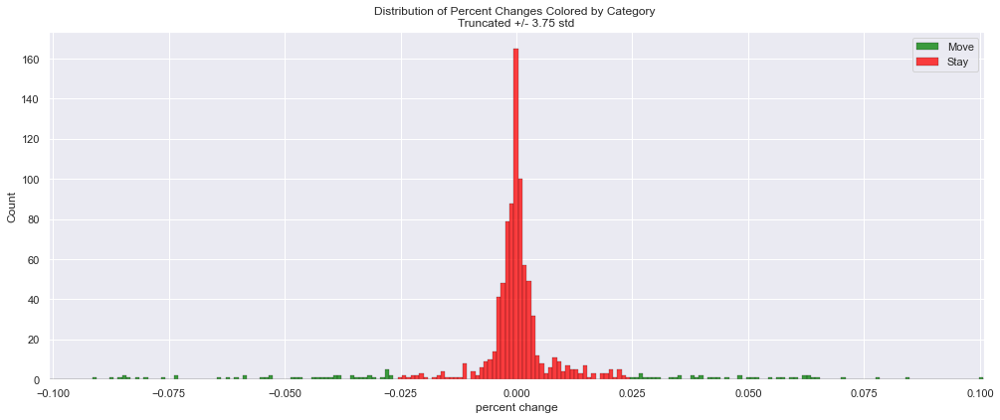

count    944.000000
mean       0.001071
std        0.026887
min       -0.176000
25%       -0.002002
50%        0.000000
75%        0.002555
max        0.232461
Name: percent change, dtype: float64


<Figure size 432x288 with 0 Axes>

In [159]:
# Define user, target, feature names
std = df['percent change'].std()
print('Value Counts:')
print(df[[target_name]].value_counts())
sns.set()
plt.figure(figsize=(15,6))
_ = sns.histplot(data = df, x='percent change',hue=target_name, stat='count', alpha=0.75, common_bins=True, palette=['red', 'green'], edgecolor='black')
plt.legend([0, 1, 2])
plt.title("Distribution of Percent Changes Colored by Category \nTruncated +/- 3.75 std")
plt.xlim(-3.75*std, 3.75*std)
plt.legend(['Move', 'Stay'])
plt.show()
plt.savefig('./figures/modeling/{}_distribution.png'.format(target_name), bbox_inches='tight', transparent=True)
print(df['percent change'].describe())

This dataset is imbalanced. The positive class (change) makes up only ~18% of data. As we are looking to see if Twitter data can predict that stocks will rise of fall within a certain percentage

In [160]:
%%time
# Clocked at 4min 5s

svm = SVC(probability = True, class_weight='balanced')
lgr = LogisticRegression(n_jobs=-1, class_weight='balanced')
nb = MultinomialNB()
clf_list = [svm, lgr, nb]

scores = cross_validation_scores(df, target_name, numerical_feat, text_name, clf_list)

CPU times: user 20.9 s, sys: 1.01 s, total: 21.9 s
Wall time: 28.7 s


In [161]:
cv_key =  "cv_1"
scores['n_features'] = len(numerical_feat)
cv_scores[cv_key] = scores
all_scores[col_name] = cv_scores

In [162]:
all_scores[col_name]['cv_1'].sort_values(by='test_roc_auc_mean', ascending=False)[:5]

,username,model,fit_time_mean,fit_time_std,score_time_mean,score_time_std,test_balanced_accuracy_mean,test_balanced_accuracy_std,test_precision_mean,test_precision_std,test_recall_mean,test_recall_std,test_f1_mean,test_f1_std,test_roc_auc_mean,test_roc_auc_std,n_samples,n_pos_label,n_features
1,richardbranson,"LogisticRegression(class_weight='balanced', n_jobs=-1)",1.535119,0.760405,0.087931,0.019892,0.745570,0.063240,0.377250,0.048179,0.617143,0.136593,0.465422,0.069718,0.843748,0.059303,660,73,15
0,richardbranson,"SVC(class_weight='balanced', probability=True)",3.217354,0.806132,0.543793,0.161223,0.748505,0.054979,0.394629,0.065286,0.616190,0.112062,0.478059,0.071722,0.842752,0.063229,660,73,15
2,richardbranson,MultinomialNB(),0.050570,0.005276,0.080393,0.010909,0.500000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.784491,0.090806,660,73,15


COLUMN: bins 
  CV_KEY: cv_1
richardbranson
Test_roc_auc_mean: 0.844
Test_roc_auc_std: 0.059
Range of test_roc_auc_mean: 0.784 -- 0.903
LogisticRegression(class_weight='balanced', n_jobs=-1)
The mean cross-validation accuracy is: 0.839 +/- 0.006
Precision: 0.391
Recall: 0.562
Balanced accuracy: 0.726
              precision    recall  f1-score   support

           0       0.94      0.89      0.91       252
           1       0.39      0.56      0.46        32

    accuracy                           0.85       284
   macro avg       0.67      0.73      0.69       284
weighted avg       0.88      0.85      0.86       284



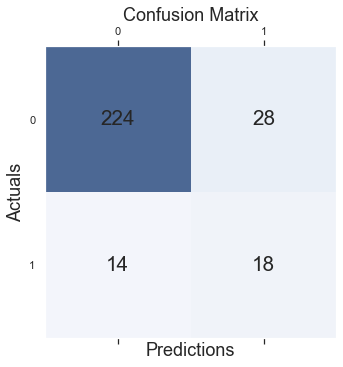

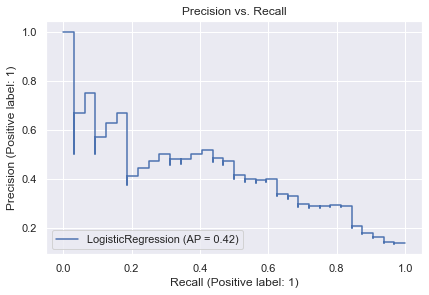

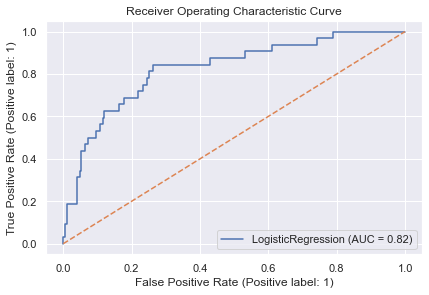

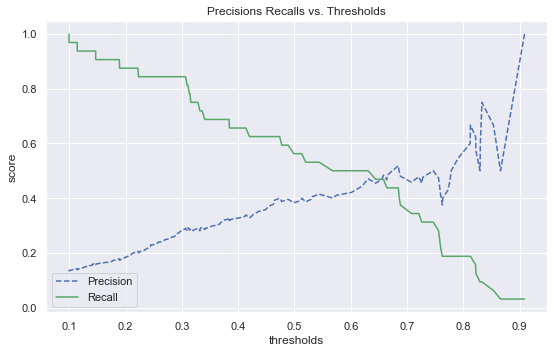

In [163]:
scorer = 'test_roc_auc'
print("COLUMN: {} \n  CV_KEY: {}".format(col_name, cv_key))
_ = examine_model(df, all_scores[col_name][cv_key], scorer, target_name, numerical_feat, pos=0, reduce=False)

Had the shortest score time, highest balanced accuracy, precision, recall, and f1

COLUMN: bins 
  CV_KEY: cv_1
richardbranson
Test_roc_auc_mean: 0.843
Test_roc_auc_std: 0.063
Range of test_roc_auc_mean: 0.780 -- 0.906
SVC(class_weight='balanced', probability=True)
The mean cross-validation accuracy is: 0.856 +/- 0.027
Precision: 0.378
Recall: 0.531
Balanced accuracy: 0.710
              precision    recall  f1-score   support

           0       0.94      0.89      0.91       252
           1       0.38      0.53      0.44        32

    accuracy                           0.85       284
   macro avg       0.66      0.71      0.68       284
weighted avg       0.87      0.85      0.86       284



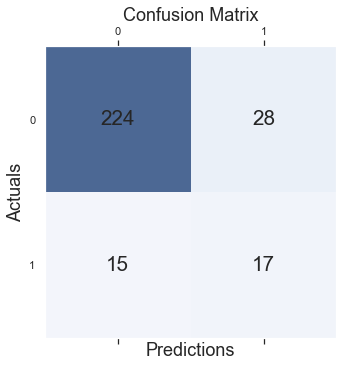

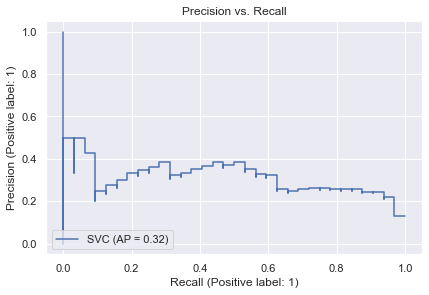

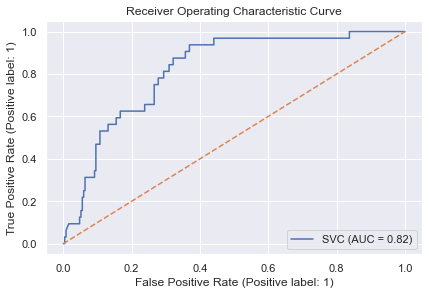

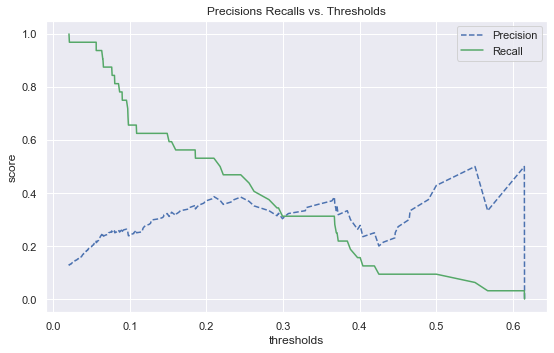

In [164]:
scorer = 'test_roc_auc'
print("COLUMN: {} \n  CV_KEY: {}".format(col_name, cv_key))
_ = examine_model(df, all_scores[col_name][cv_key], scorer, target_name, numerical_feat, pos=1, reduce=False)

better ROC_AUC

COLUMN: bins 
  CV_KEY: cv_1
richardbranson
Test_roc_auc_mean: 0.784
Test_roc_auc_std: 0.091
Range of test_roc_auc_mean: 0.694 -- 0.875
MultinomialNB()
The mean cross-validation accuracy is: 0.889 +/- 0.004
Precision: 0.000
Recall: 0.000
Balanced accuracy: 0.500
              precision    recall  f1-score   support

           0       0.89      1.00      0.94       252
           1       0.00      0.00      0.00        32

    accuracy                           0.89       284
   macro avg       0.44      0.50      0.47       284
weighted avg       0.79      0.89      0.83       284



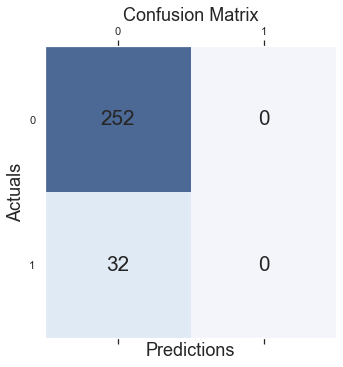

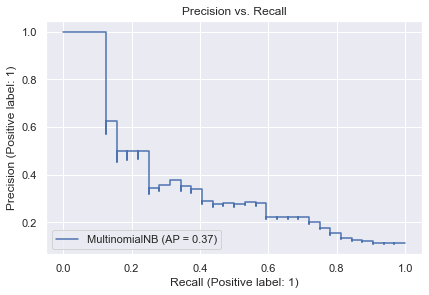

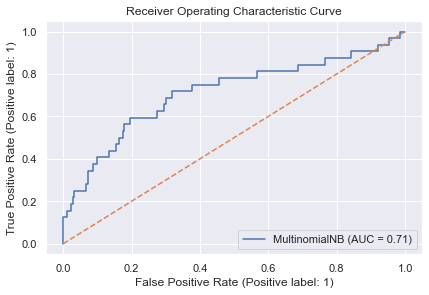

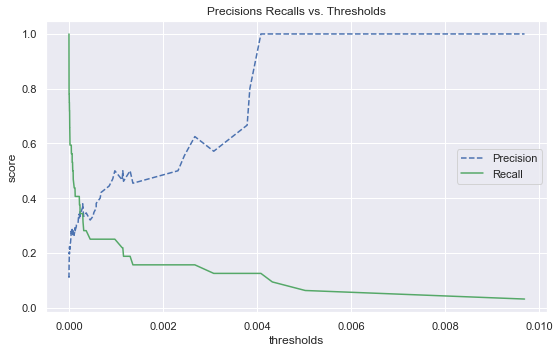

In [165]:
scorer = 'test_roc_auc'
print("COLUMN: {} \n  CV_KEY: {}".format(col_name, cv_key))
_ = examine_model(df, all_scores[col_name][cv_key], scorer, target_name, numerical_feat, pos=2, reduce=False)

not good

# Hyperparameter Tuning

# Important Parameters for Logistic Regression Tuning

- C: Inverse of regularization strength 
    - constrains the size of the model coefficients (minimize model's overfitting to the training data by reducing the variance of the model, i.e. if a model is too complex, regularization will reduce the error due to variance more than it increases the error due to bias resulting in a model that is more likely to generalize to new data.
    - floating point number (1.0 by default). Increase regularization by making number smaller. Usually tuned in powers of 10 (e.g. .01, .1, 1, 10, 100)


- penalty: Type of regularization
    - l2 (default): ridge regression - shrinks coefficients, but remain non-zero
    - l1: lasso regression - shrinks coefficients to 0 (can be used for feature selection)
    - elasticnet: combination of l1 and l2
    
    
- solver: Algorithm used for optimization
    - Solves optimization problem of calculating coefficients
        - ‘newton-cg’ - [‘l2’, ‘none’]

        - ‘lbfgs’ - [‘l2’, ‘none’]

        - ‘liblinear’ - [‘l1’, ‘l2’] (Does not support multiclass)

        - ‘sag’ - [‘l2’, ‘none’]

        - ‘saga’ - [‘elasticnet’, ‘l1’, ‘l2’, ‘none’]
        
- other hyperparameters:
    - Dual: Dual formulation is only implemented for l2 penalty with liblinear solver.
    - Intercept Scaling: Useful only when the solver ‘liblinear’ is used and self.fit_intercept is set to True.
    - l1 Ratio: The Elastic-Net mixing parameter, with 0 <= l1_ratio <= 1. Only used if penalty='elasticnet'.

# Different Solvers

In [205]:
user = 'richardbranson'
df = df_training[df_training['username'] == user].copy(deep=True)
hyperparam_tuning = pd.DataFrame()
scoring = 'f1'
X, y = make_xy(df, target_name, numerical_feat, 'cleaned')
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size = 0.3, stratify=y)

#### lbfgs

In [206]:
%%time
# Clocked at 4min 9s

solver = 'lbfgs' # does not support l1 penalty
grid={
    "C":np.logspace(-3,3,7), "penalty":["l2", 'none'],
} 

clf = LogisticRegression(class_weight='balanced', n_jobs= -1, solver=solver)
clf_cv=GridSearchCV(clf,grid,cv=10, scoring=scoring)
clf_cv.fit(X_train,y_train)

hyperparams = pd.DataFrame(clf_cv.cv_results_).sort_values(by='mean_test_score', ascending=False)
hyperparams['solver'] = solver
hyperparams['clf'] = clf_cv.estimator
hyperparams['username'] = user
hyperparam_tuning = hyperparam_tuning.append(hyperparams, ignore_index=True)

print("tuned hyperparameters :(best parameters) ",clf_cv.best_params_)
print("best score :",clf_cv.best_score_)
print('solver: {}'.format(solver))

tuned hyperparameters :(best parameters)  {'C': 1.0, 'penalty': 'l2'}
best score : 0.418921470342523
solver: lbfgs
CPU times: user 24 s, sys: 4.56 s, total: 28.6 s
Wall time: 2min 43s


LogisticRegression(class_weight='balanced', n_jobs=-1)
richardbranson
The mean cross-validation accuracy is: 0.826 +/- 0.024
Precision: 0.439
Recall: 0.562
Balanced accuracy: 0.736
              precision    recall  f1-score   support

           0       0.94      0.91      0.93       252
           1       0.44      0.56      0.49        32

    accuracy                           0.87       284
   macro avg       0.69      0.74      0.71       284
weighted avg       0.89      0.87      0.88       284



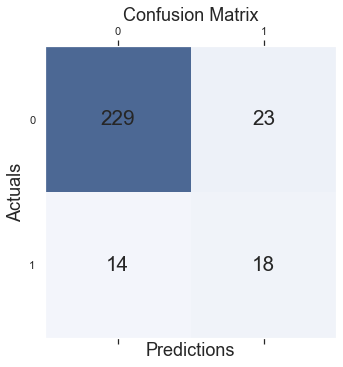

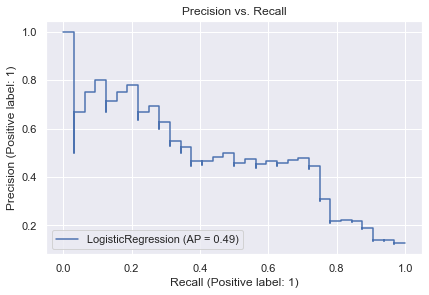

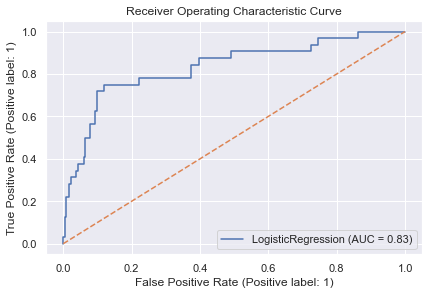

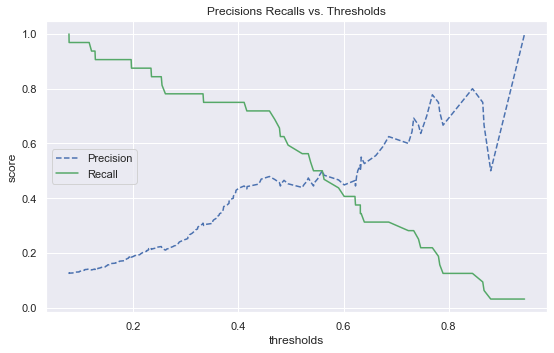

In [207]:
clf = clf_cv.best_estimator_
clf.set_params = clf_cv.best_params_
print(clf)
print(user)
#print("COLUMN: {}\n MODEL_KEY: {}\n CV_KEY: {}".format(col_name, model_key, key))
#user = all_scores[col_name][key].sort_values(by='rank_test_score')['username'].iloc[0]
full_report(clf, X_train, X_val, y_train, y_val)
y_proba = clf.predict_proba(X_val)
precisions, recalls, thresholds = precision_recall_curve(y_val, y_proba[:,1])
plt.figure(figsize=[8,5])
plot_precision_recall_vs_threshold(precisions, recalls, thresholds)

#### newton-cg

In [208]:
%%time
# Clocked at 4min 48s
solver = 'newton-cg' # does not support l1 penalty
grid={
    "C":np.logspace(-3,3,7), "penalty":["l2", 'none'],
} 

clf = LogisticRegression(class_weight='balanced', n_jobs= -1, solver=solver)
clf_cv=GridSearchCV(clf,grid,cv=10, scoring=scoring)
clf_cv.fit(X_train,y_train)


hyperparams = pd.DataFrame(clf_cv.cv_results_).sort_values(by='mean_test_score', ascending=False)
hyperparams['solver'] = solver
hyperparams['clf'] = clf_cv.estimator
hyperparams['username'] = user
hyperparam_tuning = hyperparam_tuning.append(hyperparams, ignore_index=True)

print("tuned hyperparameters :(best parameters) ",clf_cv.best_params_)
print("best score :",clf_cv.best_score_)
print('solver: {}'.format(solver))

tuned hyperparameters :(best parameters)  {'C': 1.0, 'penalty': 'l2'}
best score : 0.418921470342523
solver: newton-cg
CPU times: user 24.1 s, sys: 4.5 s, total: 28.6 s
Wall time: 3min 42s


LogisticRegression(class_weight='balanced', n_jobs=-1, solver='newton-cg')
richardbranson
The mean cross-validation accuracy is: 0.826 +/- 0.024
Precision: 0.439
Recall: 0.562
Balanced accuracy: 0.736
              precision    recall  f1-score   support

           0       0.94      0.91      0.93       252
           1       0.44      0.56      0.49        32

    accuracy                           0.87       284
   macro avg       0.69      0.74      0.71       284
weighted avg       0.89      0.87      0.88       284



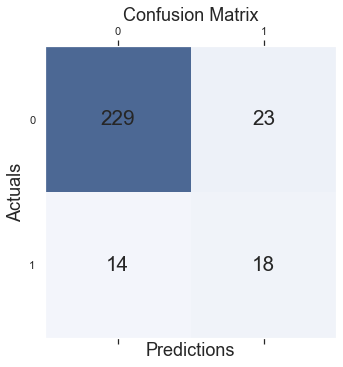

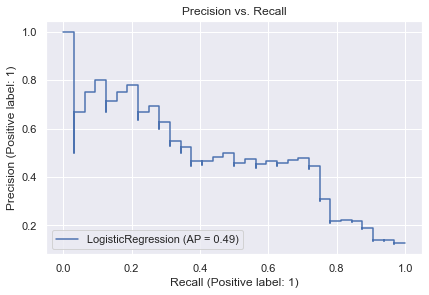

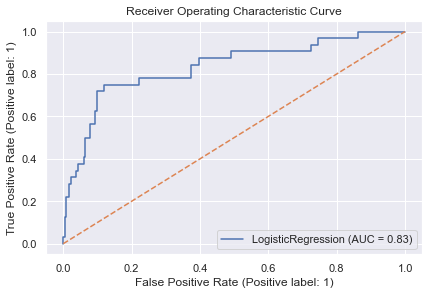

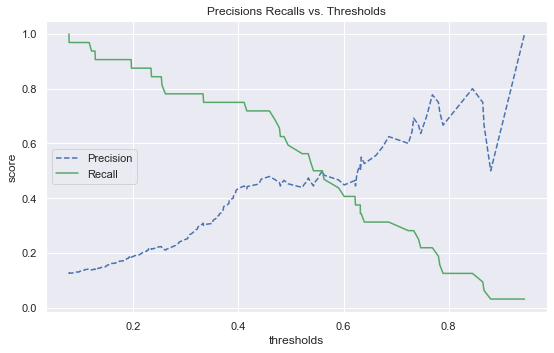

In [209]:
clf = clf_cv.best_estimator_
clf.set_params = clf_cv.best_params_
print(clf)
print(user)
#print("COLUMN: {}\n MODEL_KEY: {}\n CV_KEY: {}".format(col_name, model_key, key))
#user = all_scores[col_name][key].sort_values(by='rank_test_score')['username'].iloc[0]
full_report(clf, X_train, X_val, y_train, y_val)
y_proba = clf.predict_proba(X_val)
precisions, recalls, thresholds = precision_recall_curve(y_val, y_proba[:,1])
plt.figure(figsize=[8,5])
plot_precision_recall_vs_threshold(precisions, recalls, thresholds)

#### sag

In [210]:
%%time
# Clocked at 5min 46s
solver = 'sag' 
grid={
    "C":np.logspace(-3,3,7), "penalty":["l2", 'none']
} 

clf = LogisticRegression(class_weight='balanced', n_jobs= -1, solver=solver)
clf_cv=GridSearchCV(clf,grid,cv=10, scoring=scoring)
clf_cv.fit(X_train,y_train)

hyperparams = pd.DataFrame(clf_cv.cv_results_).sort_values(by='mean_test_score', ascending=False)
hyperparams['solver'] = solver
hyperparams['clf'] = clf_cv.estimator
hyperparams['username'] = user
hyperparam_tuning = hyperparam_tuning.append(hyperparams, ignore_index=True)

print("tuned hyperparameters :(best parameters) ",clf_cv.best_params_)
print("best score :",clf_cv.best_score_)
print('solver: {}'.format(solver))

tuned hyperparameters :(best parameters)  {'C': 0.1, 'penalty': 'l2'}
best score : 0.41853151706974795
solver: sag
CPU times: user 24.7 s, sys: 4.5 s, total: 29.2 s
Wall time: 4min 24s


LogisticRegression(C=0.1, class_weight='balanced', n_jobs=-1, solver='sag')
richardbranson
The mean cross-validation accuracy is: 0.782 +/- 0.016
Precision: 0.429
Recall: 0.750
Balanced accuracy: 0.812
              precision    recall  f1-score   support

           0       0.96      0.87      0.92       252
           1       0.43      0.75      0.55        32

    accuracy                           0.86       284
   macro avg       0.70      0.81      0.73       284
weighted avg       0.90      0.86      0.87       284



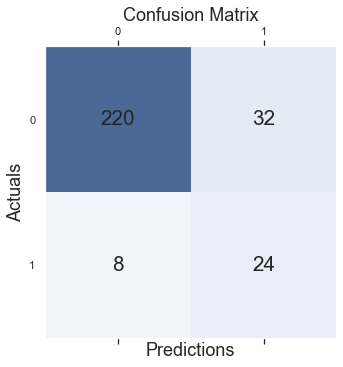

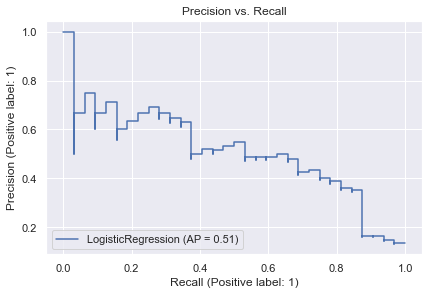

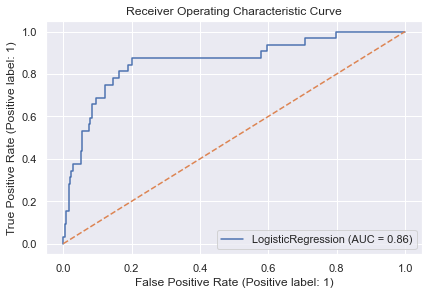

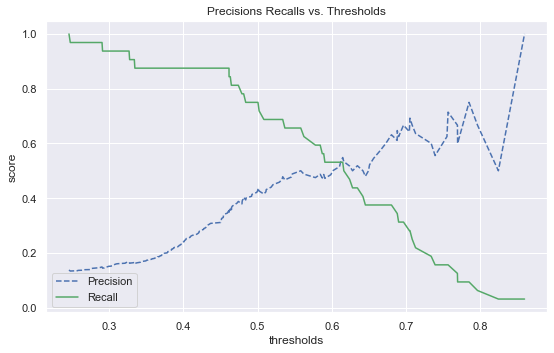

In [211]:
clf = clf_cv.best_estimator_
clf.set_params = clf_cv.best_params_
print(clf)
print(user)
#print("COLUMN: {}\n MODEL_KEY: {}\n CV_KEY: {}".format(col_name, model_key, key))
#user = all_scores[col_name][key].sort_values(by='rank_test_score')['username'].iloc[0]
full_report(clf, X_train, X_val, y_train, y_val)
y_proba = clf.predict_proba(X_val)
precisions, recalls, thresholds = precision_recall_curve(y_val, y_proba[:,1])
plt.figure(figsize=[8,5])
plot_precision_recall_vs_threshold(precisions, recalls, thresholds)

#### saga

In [212]:
%%time
# Clocked at 10min 9s
solver = 'saga' 
grid={
    "C":np.logspace(-3,3,7), "penalty":["l2", 'l1', 'none']
} 

clf = LogisticRegression(class_weight='balanced', n_jobs= -1, solver=solver)
clf_cv=GridSearchCV(clf,grid,cv=10, scoring=scoring)
clf_cv.fit(X_train,y_train)

hyperparams = pd.DataFrame(clf_cv.cv_results_).sort_values(by='mean_test_score', ascending=False)
hyperparams['solver'] = solver
hyperparams['clf'] = clf_cv.estimator
hyperparams['username'] = user
hyperparam_tuning = hyperparam_tuning.append(hyperparams, ignore_index=True)

print("tuned hyperparameters :(best parameters) ",clf_cv.best_params_)
print("best score :",clf_cv.best_score_)
print('solver: {}'.format(solver))

tuned hyperparameters :(best parameters)  {'C': 1.0, 'penalty': 'l2'}
best score : 0.418921470342523
solver: saga
CPU times: user 37.2 s, sys: 6.64 s, total: 43.9 s
Wall time: 7min 27s


LogisticRegression(class_weight='balanced', n_jobs=-1, solver='saga')
richardbranson
The mean cross-validation accuracy is: 0.826 +/- 0.024
Precision: 0.439
Recall: 0.562
Balanced accuracy: 0.736
              precision    recall  f1-score   support

           0       0.94      0.91      0.93       252
           1       0.44      0.56      0.49        32

    accuracy                           0.87       284
   macro avg       0.69      0.74      0.71       284
weighted avg       0.89      0.87      0.88       284



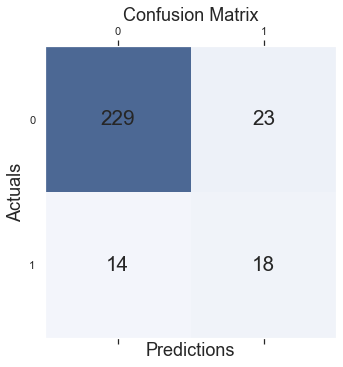

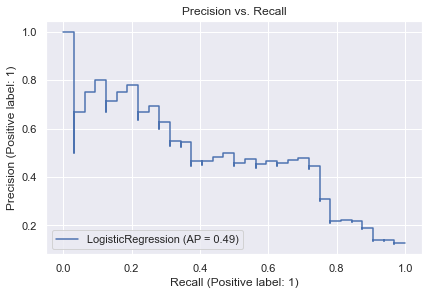

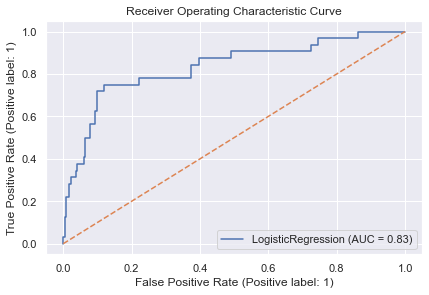

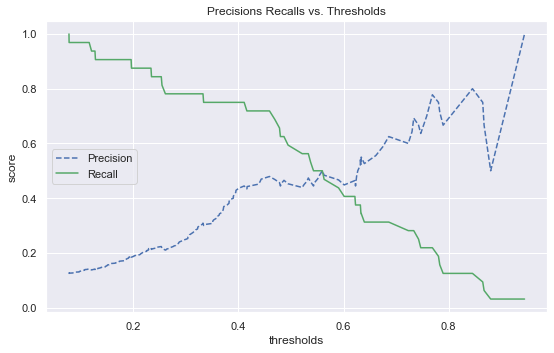

In [213]:
clf = clf_cv.best_estimator_
clf.set_params = clf_cv.best_params_
print(clf)
print(user)
#print("COLUMN: {}\n MODEL_KEY: {}\n CV_KEY: {}".format(col_name, model_key, key))
#user = all_scores[col_name][key].sort_values(by='rank_test_score')['username'].iloc[0]
full_report(clf, X_train, X_val, y_train, y_val)
y_proba = clf.predict_proba(X_val)
precisions, recalls, thresholds = precision_recall_curve(y_val, y_proba[:,1])
plt.figure(figsize=[8,5])
plot_precision_recall_vs_threshold(precisions, recalls, thresholds)

#### liblinear

In [214]:
%%time
# Clocked at 3min 17s
solver = 'liblinear' 
grid={
    "C":np.logspace(-3,3,7), "penalty":["l2", 'l1'], 'dual':[True, False], "intercept_scaling":[0.01, 0.01, 0.1, 1,10,100]
} 

clf = LogisticRegression(class_weight='balanced', n_jobs= -1, solver=solver)
clf_cv=GridSearchCV(clf,grid,cv=10, scoring=scoring)
clf_cv.fit(X_train,y_train)

hyperparams = pd.DataFrame(clf_cv.cv_results_).sort_values(by='mean_test_score', ascending=False)
hyperparams['solver'] = solver
hyperparams['clf'] = clf_cv.estimator
hyperparams['username'] = user
hyperparam_tuning = hyperparam_tuning.append(hyperparams, ignore_index=True)

print("tuned hyperparameters :(best parameters) ",clf_cv.best_params_)
print("best score :",clf_cv.best_score_)
print('solver: {}'.format(solver))

tuned hyperparameters :(best parameters)  {'C': 1.0, 'dual': True, 'intercept_scaling': 0.1, 'penalty': 'l2'}
best score : 0.4517680200850883
solver: liblinear
CPU times: user 4min 15s, sys: 20.7 s, total: 4min 36s
Wall time: 2min 51s


LogisticRegression(class_weight='balanced', dual=True, intercept_scaling=0.1,
                   n_jobs=-1, solver='liblinear')
richardbranson
The mean cross-validation accuracy is: 0.856 +/- 0.014
Precision: 0.500
Recall: 0.531
Balanced accuracy: 0.732
              precision    recall  f1-score   support

           0       0.94      0.93      0.94       252
           1       0.50      0.53      0.52        32

    accuracy                           0.89       284
   macro avg       0.72      0.73      0.73       284
weighted avg       0.89      0.89      0.89       284



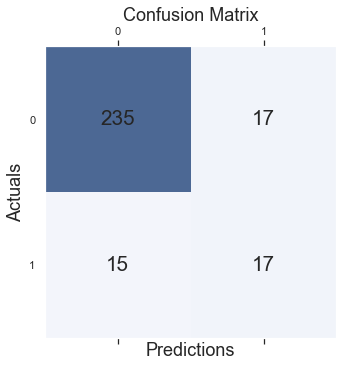

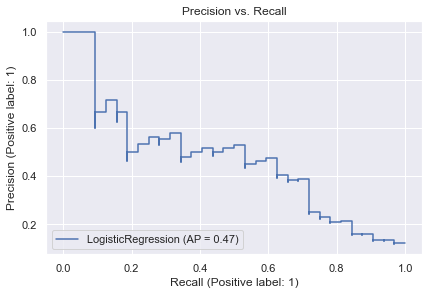

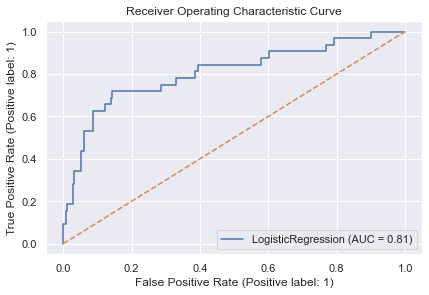

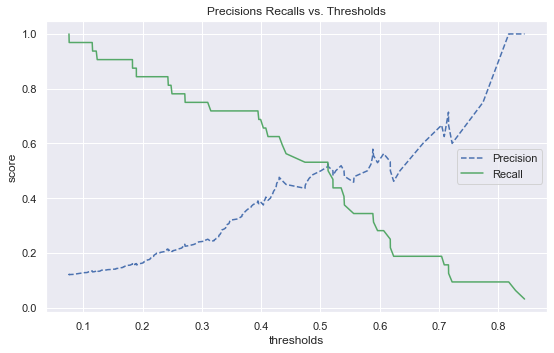

In [215]:
clf = clf_cv.best_estimator_
clf.set_params = clf_cv.best_params_
print(clf)
print(user)
#print("COLUMN: {}\n MODEL_KEY: {}\n CV_KEY: {}".format(col_name, model_key, key))
#user = all_scores[col_name][key].sort_values(by='rank_test_score')['username'].iloc[0]
full_report(clf, X_train, X_val, y_train, y_val)
y_proba = clf.predict_proba(X_val)
precisions, recalls, thresholds = precision_recall_curve(y_val, y_proba[:,1])
plt.figure(figsize=[8,5])
plot_precision_recall_vs_threshold(precisions, recalls, thresholds)

In [216]:


hyperparam_tuning = hyperparam_tuning.sort_values(by='mean_test_score', ascending=False).reset_index(drop=True)


hyperparam_tuning[:5]

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_C,param_penalty,params,split0_test_score,split1_test_score,split2_test_score,...,split8_test_score,split9_test_score,mean_test_score,std_test_score,rank_test_score,solver,clf,username,param_dual,param_intercept_scaling
0,0.087130,0.013924,0.034670,0.004572,1.0,l2,"{'C': 1.0, 'dual': True, 'intercept_scaling': 0.1, 'penalty': 'l2'}",0.50000,0.37500,0.526316,...,0.347826,0.750000,0.451768,0.133991,1,liblinear,"LogisticRegression(class_weight='balanced', n_jobs=-1, solver='liblinear')",richardbranson,True,0.1
1,0.071063,0.004046,0.030855,0.000730,1.0,l2,"{'C': 1.0, 'dual': False, 'intercept_scaling': 0.1, 'penalty': 'l2'}",0.50000,0.37500,0.526316,...,0.347826,0.750000,0.451768,0.133991,1,liblinear,"LogisticRegression(class_weight='balanced', n_jobs=-1, solver='liblinear')",richardbranson,False,0.1
2,0.079891,0.001175,0.031104,0.001136,1.0,l1,"{'C': 1.0, 'dual': False, 'intercept_scaling': 0.01, 'penalty': 'l1'}",0.50000,0.47619,0.416667,...,0.266667,0.736842,0.440702,0.128662,3,liblinear,"LogisticRegression(class_weight='balanced', n_jobs=-1, solver='liblinear')",richardbranson,False,0.01
3,0.081677,0.004273,0.030773,0.000558,1.0,l1,"{'C': 1.0, 'dual': False, 'intercept_scaling': 0.01, 'penalty': 'l1'}",0.47619,0.47619,0.416667,...,0.266667,0.736842,0.438321,0.127760,4,liblinear,"LogisticRegression(class_weight='balanced', n_jobs=-1, solver='liblinear')",richardbranson,False,0.01
4,0.080685,0.001647,0.030550,0.000259,1.0,l1,"{'C': 1.0, 'dual': False, 'intercept_scaling': 0.1, 'penalty': 'l1'}",0.47619,0.47619,0.416667,...,0.266667,0.736842,0.438321,0.127760,4,liblinear,"LogisticRegression(class_weight='balanced', n_jobs=-1, solver='liblinear')",richardbranson,False,0.1


In [217]:
top_params = hyperparam_tuning['params'].iloc[0]
top_params['solver'] =  hyperparam_tuning['solver'].iloc[0]

params_lgr = top_params
#clf = LogisticRegression(n_jobs=-1, class_weight='balanced')
#clf.set_params(**params_lgr)

print(clf)
print(clf.get_params())

LogisticRegression(class_weight='balanced', dual=True, intercept_scaling=0.1,
                   n_jobs=-1, solver='liblinear')
{'C': 1.0, 'class_weight': 'balanced', 'dual': True, 'fit_intercept': True, 'intercept_scaling': 0.1, 'l1_ratio': None, 'max_iter': 100, 'multi_class': 'auto', 'n_jobs': -1, 'penalty': 'l2', 'random_state': None, 'solver': 'liblinear', 'tol': 0.0001, 'verbose': 0, 'warm_start': False}


# Important Parameters for SVC Tuning

SVM creates a decision boundary which makes the distinction between two or more classes. How to draw or determine the decision boundary is the most critical part in SVM algorithms. When the data points in different classes are linearly separable, it is an easy task to draw a decision boundary.

It is very significant to remember for SVM that the input data need to be normalized so that features are on the same scale and compatible.

0.0001 < gamma < 10
0.1 < c < 100

#### rbf

In [218]:
%%time
# Clocked at 11min
grid={
'C': np.logspace(-1,2,4), 'gamma': np.logspace(-4,1,6)
} 
kernel = 'rbf'


# Separate into Training/Testing
clf = SVC(class_weight='balanced', probability=True, kernel=kernel)
clf_cv=GridSearchCV(clf,grid,cv=5, scoring=scoring)
clf_cv.fit(X_train,y_train)

hyperparams = pd.DataFrame(clf_cv.cv_results_).sort_values(by='mean_test_score', ascending=False)
hyperparams['kernel'] = kernel
hyperparams['clf'] = clf_cv.estimator
hyperparams['username'] = user
hyperparam_tuning = hyperparam_tuning.append(hyperparams, ignore_index=True)

print("tuned hyperparameters :(best parameters) ",clf_cv.best_params_)
print("best score :",clf_cv.best_score_)

tuned hyperparameters :(best parameters)  {'C': 100.0, 'gamma': 0.001}
best score : 0.4162290665453309
CPU times: user 7min 42s, sys: 8.71 s, total: 7min 51s
Wall time: 7min 52s


SVC(C=100.0, class_weight='balanced', gamma=0.001, probability=True)
richardbranson
The mean cross-validation accuracy is: 0.803 +/- 0.017
Precision: 0.457
Recall: 0.656
Balanced accuracy: 0.779
              precision    recall  f1-score   support

           0       0.95      0.90      0.93       252
           1       0.46      0.66      0.54        32

    accuracy                           0.87       284
   macro avg       0.71      0.78      0.73       284
weighted avg       0.90      0.87      0.88       284



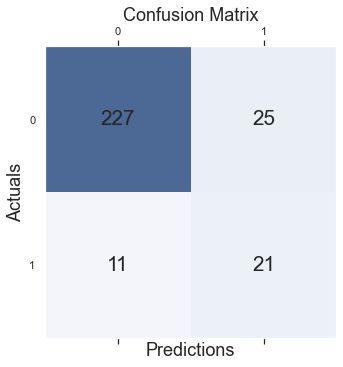

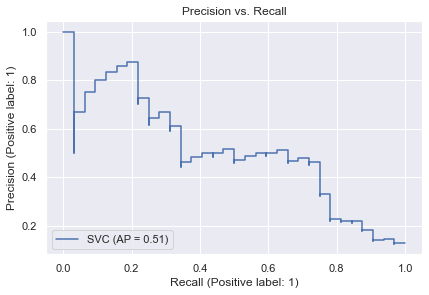

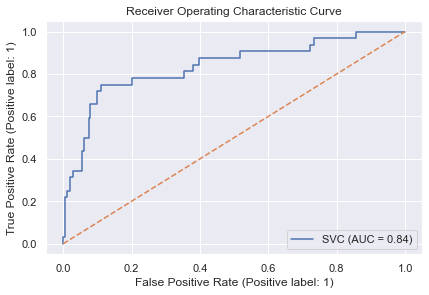

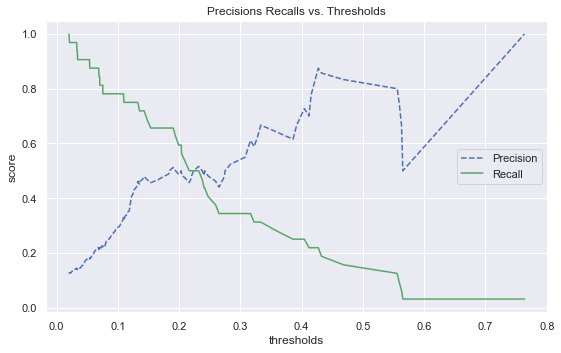

In [219]:
clf = clf_cv.best_estimator_
clf.set_params = clf_cv.best_params_
print(clf)
print(user)
#print("COLUMN: {}\n MODEL_KEY: {}\n CV_KEY: {}".format(col_name, model_key, key))
#user = all_scores[col_name][key].sort_values(by='rank_test_score')['username'].iloc[0]
full_report(clf, X_train, X_val, y_train, y_val)
y_proba = clf.predict_proba(X_val)
precisions, recalls, thresholds = precision_recall_curve(y_val, y_proba[:,1])
plt.figure(figsize=[8,5])
plot_precision_recall_vs_threshold(precisions, recalls, thresholds)

### poly

In [220]:
%%time
# Clocked at 7min 34s
grid={
'C': np.logspace(-1,2,4), 'gamma': np.logspace(-4,1,6)
} 
kernel = 'poly'



clf = SVC(class_weight='balanced', probability=True, kernel=kernel)
clf_cv=GridSearchCV(clf,grid,cv=5, scoring=scoring)
clf_cv.fit(X_train,y_train)

hyperparams = pd.DataFrame(clf_cv.cv_results_).sort_values(by='mean_test_score', ascending=False)
hyperparams['kernel'] = kernel
hyperparams['clf'] = clf_cv.estimator
hyperparams['username'] = user
hyperparam_tuning = hyperparam_tuning.append(hyperparams, ignore_index=True)

print("tuned hyperparameters :(best parameters) ",clf_cv.best_params_)
print("best score :",clf_cv.best_score_)

tuned hyperparameters :(best parameters)  {'C': 10.0, 'gamma': 0.1}
best score : 0.3884076663452266
CPU times: user 6min 7s, sys: 2.07 s, total: 6min 9s
Wall time: 6min 11s


SVC(C=10.0, class_weight='balanced', gamma=0.1, kernel='poly', probability=True)
richardbranson
The mean cross-validation accuracy is: 0.747 +/- 0.025
Precision: 0.388
Recall: 0.812
Balanced accuracy: 0.825
              precision    recall  f1-score   support

           0       0.97      0.84      0.90       252
           1       0.39      0.81      0.53        32

    accuracy                           0.83       284
   macro avg       0.68      0.82      0.71       284
weighted avg       0.91      0.83      0.86       284



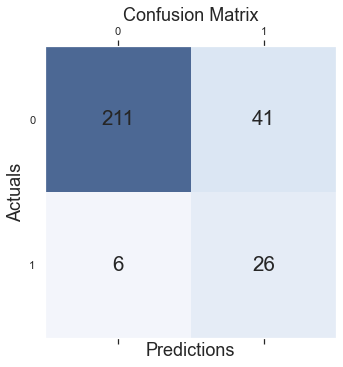

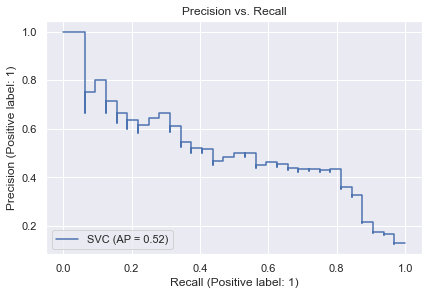

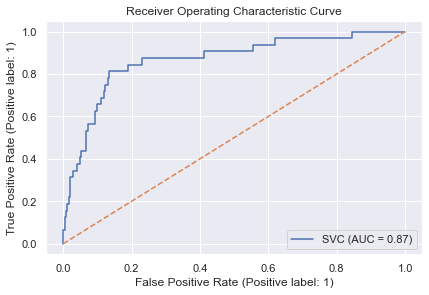

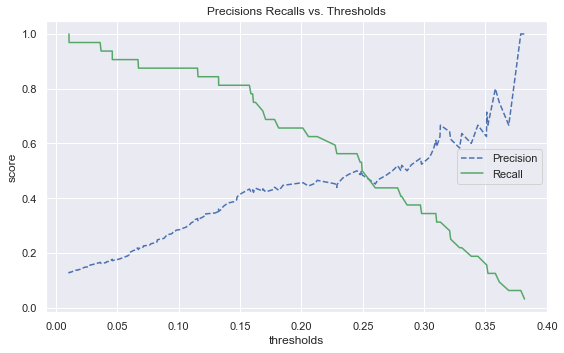

In [221]:
clf = clf_cv.best_estimator_
clf.set_params = clf_cv.best_params_
print(clf)
print(user)
#print("COLUMN: {}\n MODEL_KEY: {}\n CV_KEY: {}".format(col_name, model_key, key))
#user = all_scores[col_name][key].sort_values(by='rank_test_score')['username'].iloc[0]
full_report(clf, X_train, X_val, y_train, y_val)
y_proba = clf.predict_proba(X_val)
precisions, recalls, thresholds = precision_recall_curve(y_val, y_proba[:,1])
plt.figure(figsize=[8,5])
plot_precision_recall_vs_threshold(precisions, recalls, thresholds)

#### sigmoid

In [222]:
%%time
# Clocked at 7min 34s
grid={
'C': np.logspace(-1,2,4), 'gamma': np.logspace(-4,1,6)
} 
kernel = 'sigmoid'


clf = SVC(class_weight='balanced', probability=True, kernel=kernel)
clf_cv=GridSearchCV(clf,grid,cv=5, scoring=scoring)
clf_cv.fit(X_train,y_train)

hyperparams = pd.DataFrame(clf_cv.cv_results_).sort_values(by='mean_test_score', ascending=False)
hyperparams['kernel'] = kernel
hyperparams['clf'] = clf_cv.estimator
hyperparams['username'] = user
hyperparam_tuning = hyperparam_tuning.append(hyperparams, ignore_index=True)

print("tuned hyperparameters :(best parameters) ",clf_cv.best_params_)
print("best score :",clf_cv.best_score_)

tuned hyperparameters :(best parameters)  {'C': 1.0, 'gamma': 0.1}
best score : 0.392354170652043
CPU times: user 6min 11s, sys: 1.86 s, total: 6min 13s
Wall time: 6min 14s


SVC(class_weight='balanced', gamma=0.1, kernel='sigmoid', probability=True)
richardbranson
The mean cross-validation accuracy is: 0.782 +/- 0.018
Precision: 0.442
Recall: 0.719
Balanced accuracy: 0.802
              precision    recall  f1-score   support

           0       0.96      0.88      0.92       252
           1       0.44      0.72      0.55        32

    accuracy                           0.87       284
   macro avg       0.70      0.80      0.73       284
weighted avg       0.90      0.87      0.88       284



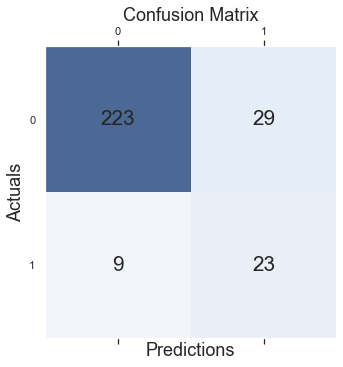

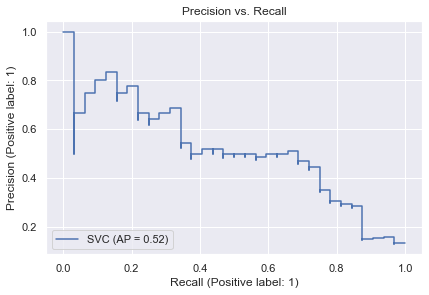

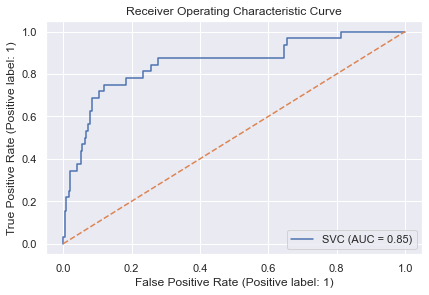

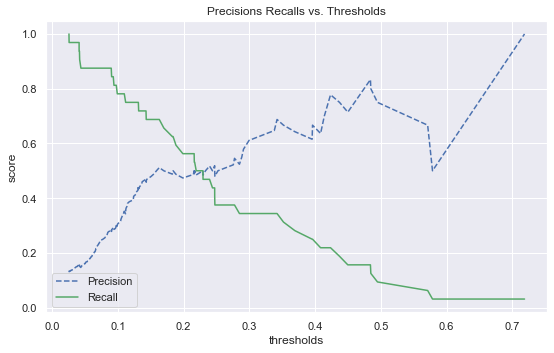

In [223]:
clf = clf_cv.best_estimator_
clf.set_params = clf_cv.best_params_
print(clf)
print(user)
#print("COLUMN: {}\n MODEL_KEY: {}\n CV_KEY: {}".format(col_name, model_key, key))
#user = all_scores[col_name][key].sort_values(by='rank_test_score')['username'].iloc[0]
full_report(clf, X_train, X_val, y_train, y_val)
y_proba = clf.predict_proba(X_val)
precisions, recalls, thresholds = precision_recall_curve(y_val, y_proba[:,1])
plt.figure(figsize=[8,5])
plot_precision_recall_vs_threshold(precisions, recalls, thresholds)

In [225]:
# Use best model

hyperparam_tuning = hyperparam_tuning.sort_values(by='mean_test_score', ascending=False).reset_index(drop=True)


hyperparam_tuning

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_C,param_penalty,params,split0_test_score,split1_test_score,split2_test_score,...,mean_test_score,std_test_score,rank_test_score,solver,clf,username,param_dual,param_intercept_scaling,param_gamma,kernel
0,0.087130,0.013924,0.034670,0.004572,1.0,l2,"{'C': 1.0, 'dual': True, 'intercept_scaling': 0.1, 'penalty': 'l2', 'solver': 'liblinear'}",0.50000,0.37500,0.526316,...,0.451768,0.133991,1,liblinear,"LogisticRegression(class_weight='balanced', n_jobs=-1, solver='liblinear')",richardbranson,True,0.1,NaN,NaN
1,0.071063,0.004046,0.030855,0.000730,1.0,l2,"{'C': 1.0, 'dual': False, 'intercept_scaling': 0.1, 'penalty': 'l2'}",0.50000,0.37500,0.526316,...,0.451768,0.133991,1,liblinear,"LogisticRegression(class_weight='balanced', n_jobs=-1, solver='liblinear')",richardbranson,False,0.1,NaN,NaN
2,0.079891,0.001175,0.031104,0.001136,1.0,l1,"{'C': 1.0, 'dual': False, 'intercept_scaling': 0.01, 'penalty': 'l1'}",0.50000,0.47619,0.416667,...,0.440702,0.128662,3,liblinear,"LogisticRegression(class_weight='balanced', n_jobs=-1, solver='liblinear')",richardbranson,False,0.01,NaN,NaN
3,0.081677,0.004273,0.030773,0.000558,1.0,l1,"{'C': 1.0, 'dual': False, 'intercept_scaling': 0.01, 'penalty': 'l1'}",0.47619,0.47619,0.416667,...,0.438321,0.127760,4,liblinear,"LogisticRegression(class_weight='balanced', n_jobs=-1, solver='liblinear')",richardbranson,False,0.01,NaN,NaN
4,0.080685,0.001647,0.030550,0.000259,1.0,l1,"{'C': 1.0, 'dual': False, 'intercept_scaling': 0.1, 'penalty': 'l1'}",0.47619,0.47619,0.416667,...,0.438321,0.127760,4,liblinear,"LogisticRegression(class_weight='balanced', n_jobs=-1, solver='liblinear')",richardbranson,False,0.1,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
298,0.055625,0.001696,0.000000,0.000000,1000.0,l1,"{'C': 1000.0, 'dual': True, 'intercept_scaling': 0.01, 'penalty': 'l1'}",NaN,NaN,NaN,...,NaN,NaN,140,liblinear,"LogisticRegression(class_weight='balanced', n_jobs=-1, solver='liblinear')",richardbranson,True,0.01,NaN,NaN
299,0.055777,0.004031,0.000000,0.000000,1000.0,l1,"{'C': 1000.0, 'dual': True, 'intercept_scaling': 0.1, 'penalty': 'l1'}",NaN,NaN,NaN,...,NaN,NaN,130,liblinear,"LogisticRegression(class_weight='balanced', n_jobs=-1, solver='liblinear')",richardbranson,True,0.1,NaN,NaN
300,0.054152,0.000532,0.000000,0.000000,1000.0,l1,"{'C': 1000.0, 'dual': True, 'intercept_scaling': 1, 'penalty': 'l1'}",NaN,NaN,NaN,...,NaN,NaN,129,liblinear,"LogisticRegression(class_weight='balanced', n_jobs=-1, solver='liblinear')",richardbranson,True,1,NaN,NaN
301,0.054255,0.000384,0.000000,0.000000,1000.0,l1,"{'C': 1000.0, 'dual': True, 'intercept_scaling': 10, 'penalty': 'l1'}",NaN,NaN,NaN,...,NaN,NaN,132,liblinear,"LogisticRegression(class_weight='balanced', n_jobs=-1, solver='liblinear')",richardbranson,True,10,NaN,NaN


In [229]:
hyperparam_tuning['solver'].value_counts()

liblinear    168
saga          21
newton-cg     14
lbfgs         14
sag           14
Name: solver, dtype: int64

In [230]:
best_models = hyperparam_tuning.copy(deep=True)

In [231]:
best_models[['clf', 'params', 'solver', 'kernel', 'username', 'mean_test_score', 'std_test_score', 'mean_fit_time', 'mean_score_time']][:3]

,clf,params,solver,kernel,username,mean_test_score,std_test_score,mean_fit_time,mean_score_time
0,"LogisticRegression(class_weight='balanced', n_jobs=-1, solver='liblinear')","{'C': 1.0, 'dual': True, 'intercept_scaling': 0.1, 'penalty': 'l2', 'solver': 'liblinear'}",liblinear,NaN,richardbranson,0.451768,0.133991,0.087130,0.034670
1,"LogisticRegression(class_weight='balanced', n_jobs=-1, solver='liblinear')","{'C': 1.0, 'dual': False, 'intercept_scaling': 0.1, 'penalty': 'l2'}",liblinear,NaN,richardbranson,0.451768,0.133991,0.071063,0.030855
2,"LogisticRegression(class_weight='balanced', n_jobs=-1, solver='liblinear')","{'C': 1.0, 'dual': False, 'intercept_scaling': 0.01, 'penalty': 'l1'}",liblinear,NaN,richardbranson,0.440702,0.128662,0.079891,0.031104


In [232]:
best_models['username'] = 'richardbranson'

In [240]:
best_models[['username', 'clf', 'params', 'solver', 'kernel','mean_test_score', 'std_test_score', 'mean_fit_time', 'mean_score_time']][:10]

,username,clf,params,solver,kernel,mean_test_score,std_test_score,mean_fit_time,mean_score_time
0,richardbranson,"LogisticRegression(class_weight='balanced', n_jobs=-1, solver='liblinear')","{'C': 1.0, 'dual': True, 'intercept_scaling': 0.1, 'penalty': 'l2', 'solver': 'liblinear'}",liblinear,NaN,0.451768,0.133991,0.087130,0.034670
1,richardbranson,"LogisticRegression(class_weight='balanced', n_jobs=-1, solver='liblinear')","{'C': 1.0, 'dual': False, 'intercept_scaling': 0.1, 'penalty': 'l2'}",liblinear,NaN,0.451768,0.133991,0.071063,0.030855
2,richardbranson,"LogisticRegression(class_weight='balanced', n_jobs=-1, solver='liblinear')","{'C': 1.0, 'dual': False, 'intercept_scaling': 0.01, 'penalty': 'l1'}",liblinear,NaN,0.440702,0.128662,0.079891,0.031104
3,richardbranson,"LogisticRegression(class_weight='balanced', n_jobs=-1, solver='liblinear')","{'C': 1.0, 'dual': False, 'intercept_scaling': 0.01, 'penalty': 'l1'}",liblinear,NaN,0.438321,0.127760,0.081677,0.030773
4,richardbranson,"LogisticRegression(class_weight='balanced', n_jobs=-1, solver='liblinear')","{'C': 1.0, 'dual': False, 'intercept_scaling': 0.1, 'penalty': 'l1'}",liblinear,NaN,0.438321,0.127760,0.080685,0.030550
5,richardbranson,"LogisticRegression(class_weight='balanced', n_jobs=-1, solver='liblinear')","{'C': 1.0, 'dual': False, 'intercept_scaling': 0.01, 'penalty': 'l2'}",liblinear,NaN,0.435935,0.114634,0.070555,0.031498
6,richardbranson,"LogisticRegression(class_weight='balanced', n_jobs=-1, solver='liblinear')","{'C': 1.0, 'dual': False, 'intercept_scaling': 0.01, 'penalty': 'l2'}",liblinear,NaN,0.435935,0.114634,0.070749,0.030885
7,richardbranson,"LogisticRegression(class_weight='balanced', n_jobs=-1, solver='liblinear')","{'C': 1.0, 'dual': True, 'intercept_scaling': 0.01, 'penalty': 'l2'}",liblinear,NaN,0.435935,0.114634,0.073115,0.030898
8,richardbranson,"LogisticRegression(class_weight='balanced', n_jobs=-1, solver='liblinear')","{'C': 1.0, 'dual': True, 'intercept_scaling': 0.01, 'penalty': 'l2'}",liblinear,NaN,0.435935,0.114634,0.074420,0.030772
9,richardbranson,"LogisticRegression(class_weight='balanced', n_jobs=-1, solver='liblinear')","{'C': 1.0, 'dual': True, 'intercept_scaling': 1, 'penalty': 'l2'}",liblinear,NaN,0.426391,0.125931,0.071700,0.030787


In [234]:
clf = hyperparam_tuning['clf'].iloc[0]
hyperparam_tuning['params'].iloc[0]

{'C': 1.0,
 'dual': True,
 'intercept_scaling': 0.1,
 'penalty': 'l2',
 'solver': 'liblinear'}

In [235]:
clf.set_params = hyperparam_tuning['params'].iloc[0]

In [236]:
clf.get_params()

{'C': 1.0,
 'class_weight': 'balanced',
 'dual': False,
 'fit_intercept': True,
 'intercept_scaling': 1,
 'l1_ratio': None,
 'max_iter': 100,
 'multi_class': 'auto',
 'n_jobs': -1,
 'penalty': 'l2',
 'random_state': None,
 'solver': 'liblinear',
 'tol': 0.0001,
 'verbose': 0,
 'warm_start': False}

# Running on test data

In [237]:
# Separate Training from Testing
user = 'richardbranson'
train_data = df_training.copy(deep=True)
train_data = train_data[train_data['username']==user]
test_data = df_testing.copy(deep=True)
test_data = test_data[test_data['username']==user]
train_data.reset_index(inplace=True, drop=True)
train_idx = train_data.index
start = len(train_data)
stop = len(train_data)+len(test_data)
test_idx = np.arange(start, stop)
test_data.index = test_idx

target_name = 'classification'
text_name = 'cleaned'
col_name = 'bins' 

df = pd.concat([train_data, test_data])

In [238]:
%%time
X, y = make_xy(df,
    target_name,
    numerical_feat,
    text_name)

X_train = X.loc[train_idx]
X_test = X.loc[test_idx]
y_train = y.loc[train_idx]
y_test = y.loc[test_idx]

clf.fit(X_train, y_train)
y_pred = clf.predict(X_test)
print(classification_report(y_test, y_pred))
print(confusion_matrix(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.92      0.83      0.87       390
           1       0.39      0.62      0.48        71

    accuracy                           0.79       461
   macro avg       0.66      0.72      0.68       461
weighted avg       0.84      0.79      0.81       461

[[322  68]
 [ 27  44]]
CPU times: user 394 ms, sys: 95.2 ms, total: 490 ms
Wall time: 493 ms


richardbranson
LogisticRegression(class_weight='balanced', n_jobs=-1, solver='liblinear')
The mean cross-validation accuracy is: 0.839 +/- 0.027
Precision: 0.393
Recall: 0.620
Balanced accuracy: 0.723
              precision    recall  f1-score   support

           0       0.92      0.83      0.87       390
           1       0.39      0.62      0.48        71

    accuracy                           0.79       461
   macro avg       0.66      0.72      0.68       461
weighted avg       0.84      0.79      0.81       461



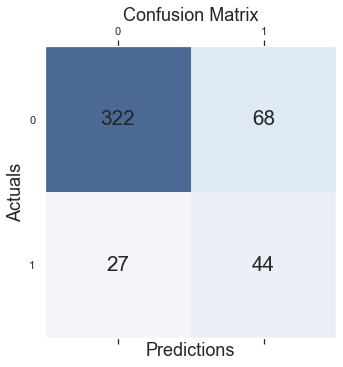

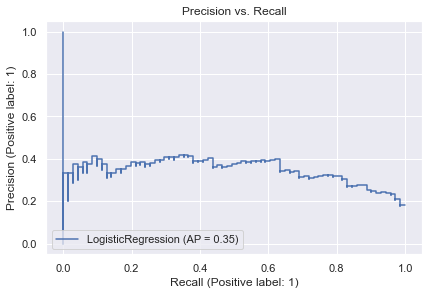

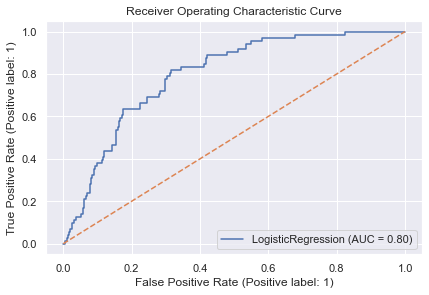

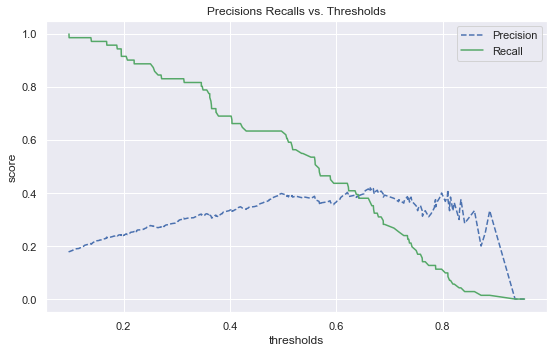

In [239]:
print(user)
print(clf)
full_report(clf, X_train, X_test, y_train, y_test)
y_proba = clf.predict_proba(X_test)
precisions, recalls, thresholds = precision_recall_curve(y_test, y_proba[:,1])
plt.figure(figsize=[8,5])
plot_precision_recall_vs_threshold(precisions, recalls, thresholds)

In [241]:
f1_scores = []
for thresh in thresholds:
    y_pred = (clf.predict_proba(X_test)[:,1] >= thresh).astype(int)
    f1 = f1_score(y_test, y_pred, pos_label=1)
    f1_scores.append(f1)
f1_scores = np.array(f1_scores)

In [242]:
best_f1 = f1_scores.max()

In [243]:
best_f1

0.4891304347826088

In [244]:
idx = f1_scores.argsort()[-1]

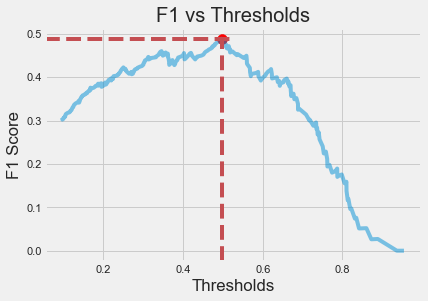

f1 score: 0.489
Threshold: 0.497


In [245]:
plt.style.use('fivethirtyeight')
plt.scatter(thresholds[idx], f1_scores[idx], color='red', alpha=1, s=100)
sns.lineplot(x=thresholds, y=f1_scores, alpha=0.5)
plt.xlabel('Thresholds')
plt.ylabel('F1 Score')
plt.title('F1 vs Thresholds')
plt.axvline(x=thresholds[idx], ymin=0, ymax=0.95, linestyle='--', c='r')
plt.axhline(y=best_f1, xmin=0, xmax=0.5, linestyle='--' ,c='r')
plt.show()

print('f1 score: {:.3f}\nThreshold: {:.3f}'.format(f1_scores[idx], thresholds[idx]))

Threshold: 0.497


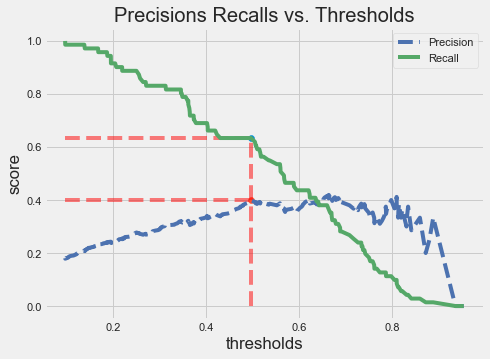

              precision    recall  f1-score   support

           0       0.93      0.83      0.87       390
           1       0.40      0.63      0.49        71

    accuracy                           0.80       461
   macro avg       0.66      0.73      0.68       461
weighted avg       0.84      0.80      0.81       461



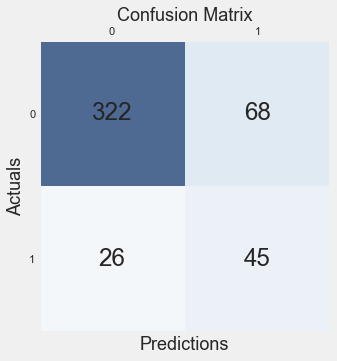

  Confusion Matrix Metrics
  How often is the classifier correct?
  Accuracy: 45.698%

  How often is it wrong?
  Error Rate: -44.698%

  When it's actually yes, how often does it predict yes?
  True Positive Rate (Recall): 63.380%

  When it predicts yes, how often is it correct?
  Precision: 39.823%

  When it's actually no, how often does it predict yes?
  False Positive Rate: 17.436%

  When it's actually no, how often does it predict no?
  True Negative Rate (Specificity): 82.564%
  F1 Score: 0.489
  Weighted F1 Score (beta = 2): 0.567
  G-mean: 0.502


In [256]:
thresh = plot_threshold(precisions, recalls, thresholds, clf, recall_thresh=0.62)

y_pred = (clf.predict_proba(X_test)[:,1] >= thresh).astype(int)
print(classification_report(y_test, y_pred))
plot_confusion_matrix(y_test, y_pred, show_metrics=True)

In [257]:
save_richardbranson = df.copy(deep=True)

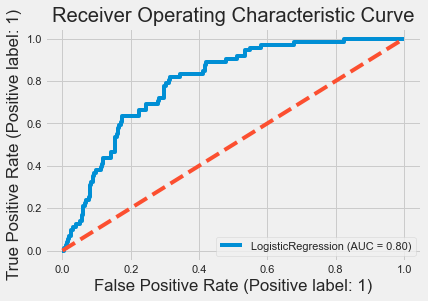

In [258]:
plot_roc_curve(clf, X_test, y_test, pos_label=1)
from sklearn.dummy import DummyClassifier
dummy_classifier = DummyClassifier(strategy="most_frequent")
dummy_classifier.fit(X_train, y_train)
y_score = dummy_classifier.predict_proba(X_test)
fpr, tpr, thresh = metrics.roc_curve(y_test, y_score[:,1])
auc = metrics.roc_auc_score(y_test, y_score[:,1])
plt.plot(fpr,tpr,label="data 2, auc="+str(auc), linestyle='--')
plt.title("Receiver Operating Characteristic Curve")
plt.show()

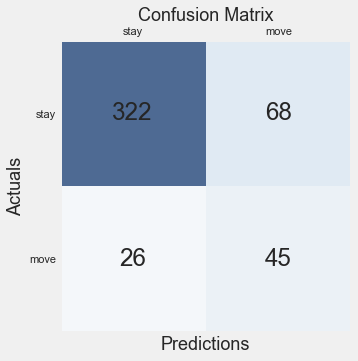

In [259]:
plt.style.use('fivethirtyeight')

mat = confusion_matrix(y_test, y_pred)
#https://vitalflux.com/python-draw-confusion-matrix-matplotlib/
fig, ax = plt.subplots(figsize=(5, 5))
ax.matshow(mat, cmap=plt.cm.Blues, alpha=0.7)
for i in range(mat.shape[0]):
    for j in range(mat.shape[1]):
        ax.text(x=j, y=i,s=mat[i, j], va='center', ha='center', size='xx-large')

plt.xlabel('Predictions', fontsize=18)
plt.xticks(ticks = [0,1], labels = ['stay', 'move'])
plt.yticks(ticks = [0,1], labels = ['stay', 'move'])
plt.ylabel('Actuals', fontsize=18)
plt.title('Confusion Matrix', fontsize=18)
plt.grid(False)

plt.show()

# Interpretation

In [260]:
most_predictive_words(clf, train_data['cleaned'], train_data['bins'], min_df=1)


 Most Predictive Words for bin: move
     
                jane 0.71
             america 0.71
               proud 0.71
             podcast 0.72
                kill 0.73
                kind 0.74
         spaceflight 0.77
             service 0.77
              virgin 0.81
               dream 0.82

 Most Predictive Words for bin: stay
     
                live 0.78
                team 0.78
                find 0.78
                life 0.78
                want 0.79
               enjoy 0.80
                need 0.81
                good 0.81
               quote 0.83
                 way 0.84




In [261]:
text = train_data['cleaned']
target = train_data['bins']
vectorizer = TfidfVectorizer(min_df=1)
X = vectorizer.fit_transform(text)
y = target
clf.fit(X, y)



LogisticRegression(class_weight='balanced', n_jobs=-1, solver='liblinear')

In [262]:
words_probs = pd.DataFrame()
words = np.array(vectorizer.get_feature_names())
x = np.eye(X.shape[1])
for i in range(len(clf.classes_)):
    probs = clf.predict_proba(x)[:, i]
    ind = np.argsort(probs)

    good_words = words[ind[-5:]]

    good_prob = probs[ind[-5:]]
    
    all_words = pd.DataFrame(columns=['words', 'probability', 'class'])
    all_words['words'] = good_words
    all_words['probability'] = good_prob
    all_words['class'] = clf.classes_[i]
    
    words_probs = words_probs.append(all_words)

    print("\n Most Predictive Words for bin: {}\n     ".format(clf.classes_[i]))
    for w, p in zip(good_words, good_prob):
        print("{:>20}".format(w), "{:.2f}".format(p))
print('\n')


 Most Predictive Words for bin: move
     
                kind 0.74
         spaceflight 0.77
             service 0.77
              virgin 0.81
               dream 0.82

 Most Predictive Words for bin: stay
     
               enjoy 0.80
                need 0.81
                good 0.81
               quote 0.83
                 way 0.84




Text(0.5, 1.0, 'Most Predictive Words per Class')

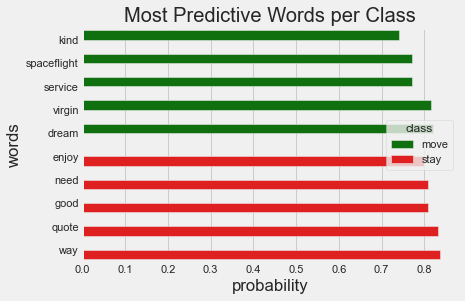

In [263]:
words_probs

sns.barplot(y='words', x='probability', data=words_probs, hue='class', palette=['green', 'red'])
plt.title('Most Predictive Words per Class')

In [264]:
target_word = 'virgin'
i = get_index(test_data['cleaned'], target_word)
test_data['tweet'].loc[i]

'The creators of Trivial Pursuit were intending to play a game of Scrabble, but found there were some pieces missing. Rather than get annoyed about the faulty game, they decided to create their own. The best ideas often come out of frustration  https://t.co/9bGVdGhjAR  https://t.co/CmjE7Fc9Jr I love playing chess - I can combine the thrill of risk taking and strategy planning with a cup of tea and a nice chat with a friend.  https://t.co/9bGVdGhjAR  https://t.co/FFrgRf9kJK Playing a game of chess reminded me about the business idea that got away:  https://t.co/9bGVdGhjAR  https://t.co/4hRAsY9M4e Wonderful news that the #organdonation bill has cleared UK parliament. Max and Kiera’s Law will saved hundreds of lives every year From a record shop to a lifestyle retail experience – the evolution of Virgin Megastores  https://t.co/Snn8QaoyX3 @VirginMENA  https://t.co/h0yXRbyFvj '

[[0.74184439 0.25815561]]
Document id: 949
Percent Change: 0.002
Probability(Change) = 0.279
True class: stay


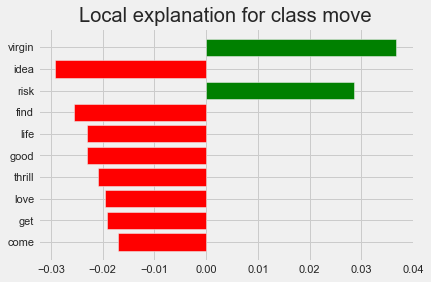

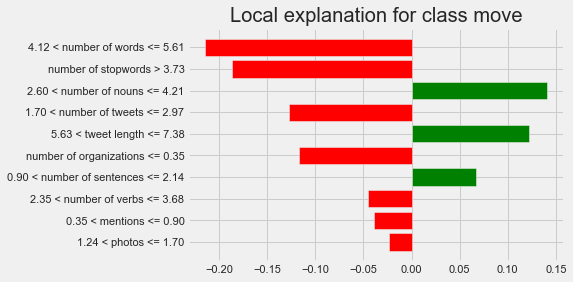

In [265]:
idx = i
class_names = ['stay', 'move']
interpret_instance(clf, train_data, test_data, class_names, idx, numerical_feat, 10)

In [266]:
classifications = pd.DataFrame()
classifications['actual'] = y_test.copy(deep=True)
classifications['percent change'] = test_data['percent change']
classifications['y_pred'] = y_pred
classifications['y_proba_1'] = y_proba[:,1]
misclassifications = classifications[classifications['actual'] != classifications['y_pred']]
correct_classifications = classifications[classifications['actual'] == classifications['y_pred']]
print('Incorrectly predicted actual {} as {} {} times'.format(labels[1].upper(),labels[0].upper(),len(misclassifications[misclassifications['actual'] == 1])))
print('Top 5 misclassifications')
misclassifications[misclassifications['actual'] == 1].sort_values(by='y_proba_1')[:5]

Incorrectly predicted actual MOVE as STAY 26 times
Top 5 misclassifications


,actual,percent change,y_pred,y_proba_1
1396,1,-0.126070,0,0.097247
985,1,0.025461,0,0.138465
1150,1,-0.065967,0,0.168043
1338,1,0.038554,0,0.187157
1113,1,0.090431,0,0.195468


In [267]:
idx = misclassifications[misclassifications['actual'] == 1].sort_values(by='y_proba_1').index[0]
test_data['tweet'].loc[idx]

'The idea that inspired encouraging people to pinch @VirginAtlantic’s salt and pepper pots:  https://t.co/qNjPqe5IL6  https://t.co/8Ngy3Ds6zY .@virginpulse hired over 600 new team members last year. Here’s a look at what life is like at the company:  https://t.co/qsSy4binx0 #VirginFamily  https://t.co/MUFLvPQesk Had so much fun joining @VirginVoyages as their first cruise ship, Scarlet Lady, sets sail for the very first time:  https://t.co/CZtPElRZyh  https://t.co/9r42qGeVNi @DoverDC @VirginVoyages @VirginAtlantic @Port_of_Dover @DoverRNLI Thanks for having me and for the trip down memory lane! @xCarrie82x @GMB @kategarraway @adilray @VirginHolidays Happy to hear this Carrie. Have a wonderful holiday – and maybe a @VirginVoyages cruise too some time soon An interesting idea about how to make meetings more productive:  https://t.co/CcP7svb0VP #ReadByRichard  https://t.co/QNP7qgj4JF Great to see @Virgin_Sport create a challenge that encourages teams and workplaces to become more active: 

[[0.74184439 0.25815561]]
Document id: 1396
Percent Change: -0.126
Probability(Change) = 0.348
True class: move


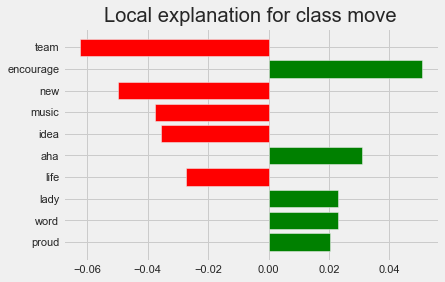

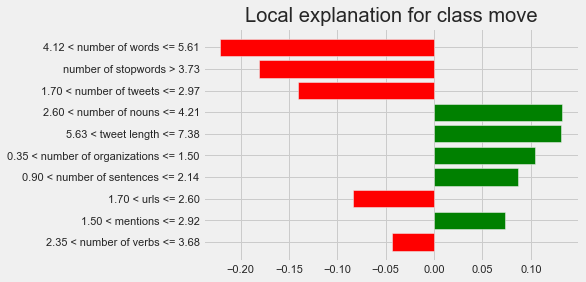

In [268]:
interpret_instance(clf, train_data, test_data, labels, idx, numerical_feat, 10)

In [269]:
# Greatest Change% Disparity

np.abs(misclassifications[misclassifications['actual'] == 1]).sort_values(by='percent change', ascending=False)[:5]

,actual,percent change,y_pred,y_proba_1
1033,1,0.151361,0,0.195555
1396,1,0.126070,0,0.097247
1109,1,0.102003,0,0.258335
1017,1,0.100382,0,0.347772
999,1,0.095912,0,0.373588


In [270]:
idx = np.abs(misclassifications[misclassifications['actual'] == 1]).sort_values(by='percent change', ascending=False).index[0]
print('Predicted to be {} with {:.2f}% probability. Stock change is {:.2f}% '.format(labels[1].upper(), misclassifications['y_proba_1'].loc[idx] * 100, misclassifications['percent change'].loc[idx] *100))
#test_data['tweet'].loc[idx]

Predicted to be MOVE with 19.56% probability. Stock change is -15.14% 


In [271]:
test_data['tweet'].loc[idx]

'It’s heartening to see the Caribbean is at the forefront of solutions and is leading the clean energy transition  https://t.co/Y78vHIAHyT @RockyMtnInst  https://t.co/cQxSE9Ii2R @Virgin_Orbit Thanks for being part of the #VirginFamily Kelly @inaherlihy It’s the little things… “Being globally minded means making the world smaller through shared passions. Although we may be far apart, we all have the same goal: to make an impact.” - @HollyBranson  https://t.co/gtlc44Hx8u  https://t.co/KLXKrXML4G “There is still much work to be done, and we must not waiver in our efforts to protect Africa’s wildlife.”@sidesofahorn writer and director, @tobywosskow is sparking a global conversation about the rhino poaching crisis:  https://t.co/hqUHHRx5G9  https://t.co/UgWPx0qydj An insightful look at how small habits can made big changes:  https://t.co/jln9RGOMau #ReadByRichard  https://t.co/cwjcquMFzE Wonderful to hear how @VirginLimitedEd are placing people, purpose and sustainability at their very hear

[[0.74184439 0.25815561]]
Document id: 1033
Percent Change: -0.151
Probability(Change) = 0.387
True class: move


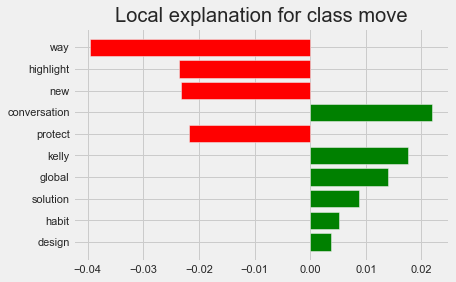

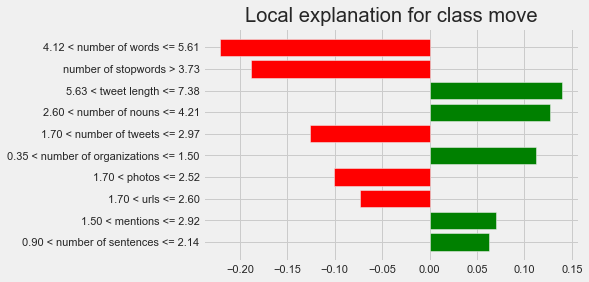

In [272]:
interpret_instance(clf, train_data, test_data, labels, idx, numerical_feat, 10)

In [273]:
print('Incorrectly predicted actual {} as {} {} times'.format(labels[0].upper(),labels[1].upper(),len(misclassifications[misclassifications['actual'] == 0])))
print('Top 5 misclassifications')
misclassifications[misclassifications['actual'] == 0].sort_values(by='y_proba_1', ascending=False)[:5]

Incorrectly predicted actual STAY as MOVE 68 times
Top 5 misclassifications


,actual,percent change,y_pred,y_proba_1
1049,0,0.004274,1,0.954260
1357,0,0.015534,1,0.936386
1206,0,-0.003337,1,0.880374
1041,0,-0.010274,1,0.872508
1247,0,-0.014795,1,0.841611


In [274]:
idx = misclassifications[misclassifications['actual'] == 0].sort_values(by='y_proba_1', ascending=False).index[0]
test_data['tweet'].loc[idx]

'Proud dad! '

In [275]:
test_data.loc[idx]

date                       2020-12-04 09:30:00
tweet                              Proud dad! 
username                        richardbranson
mentions                                   0.0
hashtags                                   0.0
video                                      0.0
photos                                     0.0
urls                                       0.0
number of tweets                      0.693147
price                                28.200001
percent change                        0.004274
sum of features                              0
bins                                      stay
text                                Proud dad!
number of emojis                           0.0
tweet length                          2.397895
number of sentences                   0.693147
number of words                       1.098612
avg words per sentence                1.098612
number of nouns                       0.693147
number of verbs                            0.0
number of sto

[[0.74184439 0.25815561]]
Document id: 1049
Percent Change: 0.004
Probability(Change) = 0.533
True class: stay


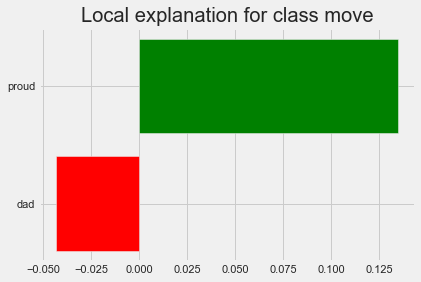

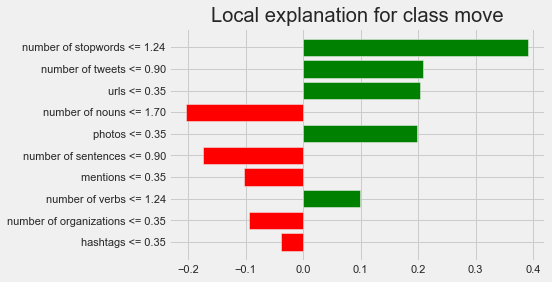

In [276]:
interpret_instance(clf, train_data, test_data, labels, idx, numerical_feat, 10)
#text_prob_visual_test(clf, train_data, test_data, labels, idx, numerical_feat)

In [277]:
idx = np.abs(misclassifications[misclassifications['actual'] == 0]).sort_values(by='percent change').index[0]
print('Predicted to be {} with {:.2f}% probability. Stock change is {:.2f}% '.format(labels[1].upper(), misclassifications['y_proba_1'].loc[idx] * 100, misclassifications['percent change'].loc[idx] *100))
test_data['tweet'].loc[idx]

Predicted to be MOVE with 63.79% probability. Stock change is 0.00% 


'So much ocean conservation action in Belize this week. The Commonwealth Marine Economy program piloted  1st Containerised Autonomous Maritime Environmental Laboratory as part of  Commonwealth Blue Charter:  https://t.co/n6CVnU5P9b just before we head to the Blue Hole @oceanunite A sneak peek inside the restaurants you can expect on board @VirginVoyages first ship  https://t.co/HtoKMVwpTp  https://t.co/XoaFI76iQ3 Almost lost my shorts when we won the @neckercup - it was worth it  https://t.co/BT0XeImGll #NeckerCup  https://t.co/ENo5Zt5zA3 '

[[0.74184439 0.25815561]]
Document id: 1333
Percent Change: 0.000
Probability(Change) = 0.402
True class: stay


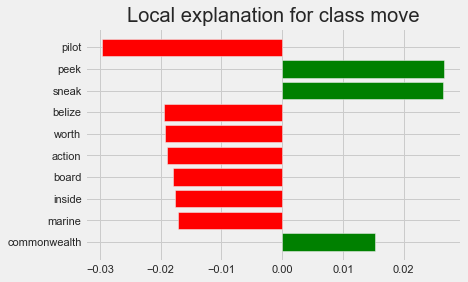

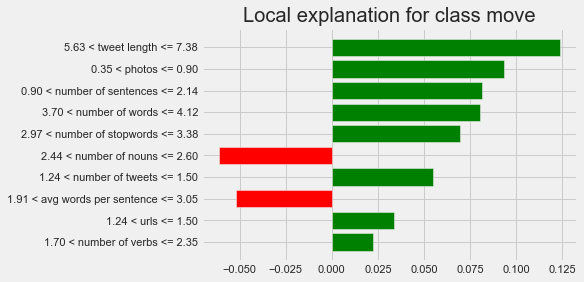

In [278]:
interpret_instance(clf, train_data, test_data, labels, idx, numerical_feat, 10)

In [279]:
best_lgr_classifications = classifications
classifications

,actual,percent change,y_pred,y_proba_1
944,1,0.028818,1,0.567700
945,0,0.000394,0,0.275564
946,0,0.004000,0,0.073731
947,0,0.000995,0,0.070870
948,0,-0.001986,0,0.117250
...,...,...,...,...
1400,1,-0.036410,0,0.255878
1401,1,0.044558,1,0.740673
1402,1,-0.109027,1,0.888678
1403,0,-0.000958,0,0.065002


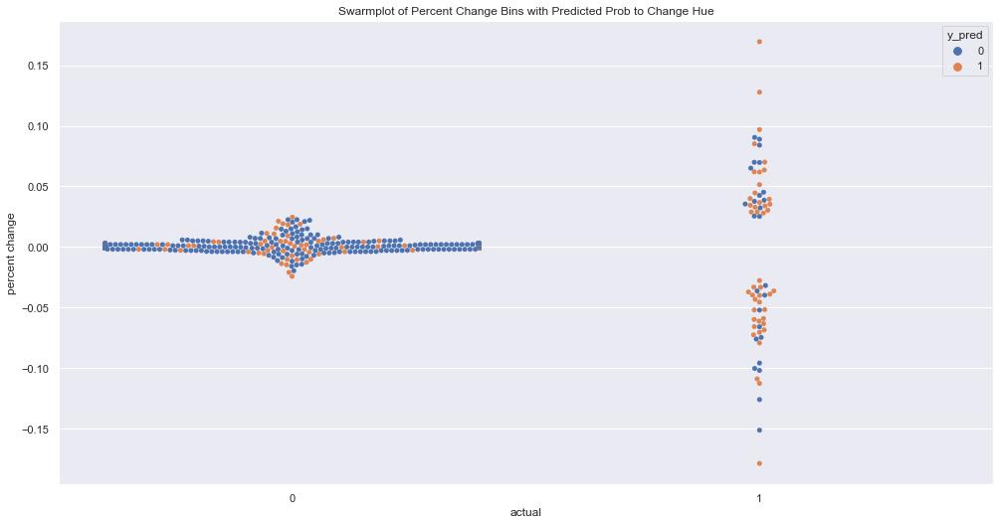

In [280]:
sns.set()
fig, ax = plt.subplots(figsize=(15,8))
ax = sns.swarmplot(y="percent change", x='actual', hue="y_pred", data=classifications, size=5)
norm = plt.Normalize(classifications['y_proba_1'].min(), classifications['y_proba_1'].max())

# Remove the legend and add a colorbar
ax.get_legend()
plt.title('Swarmplot of Percent Change Bins with Predicted Prob to Change Hue')
plt.savefig('./figures/modeling/swarmplot_cat.png', bbox_inches='tight')

plt.show()

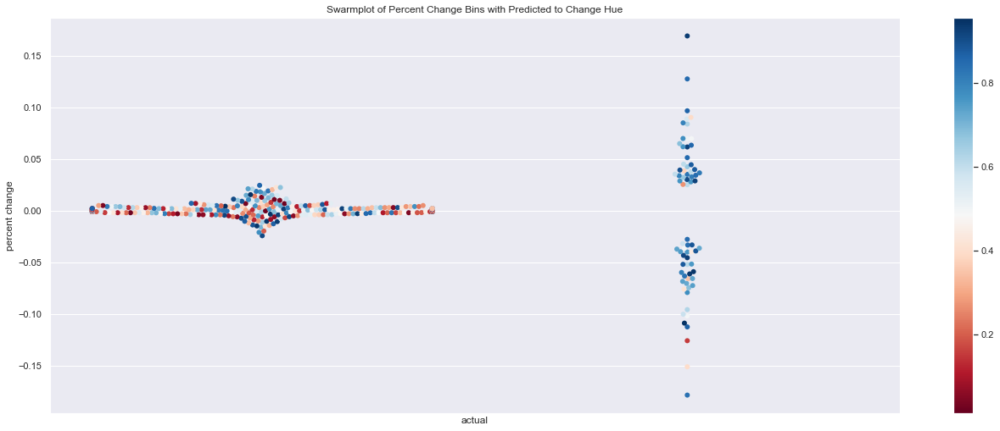

In [281]:
#### sns.set()
fig, ax = plt.subplots(figsize=(20,8))
ax = sns.swarmplot(y="percent change", x='actual', hue="y_proba_1", palette='RdBu', data=classifications, size=6)
norm = plt.Normalize(classifications['y_proba_1'].min(), classifications['y_proba_1'].max())
sm = plt.cm.ScalarMappable(cmap="RdBu", norm=norm)
sm.set_array([])

# Remove the legend and add a colorbar
ax.get_legend().remove()
ax.figure.colorbar(sm)
plt.title('Swarmplot of Percent Change Bins with Predicted to Change Hue')
plt.xticks(ticks=[])
plt.savefig('./figures/modeling/swarmplot_pred.png', bbox_inches='tight', transparent=True)

plt.show()

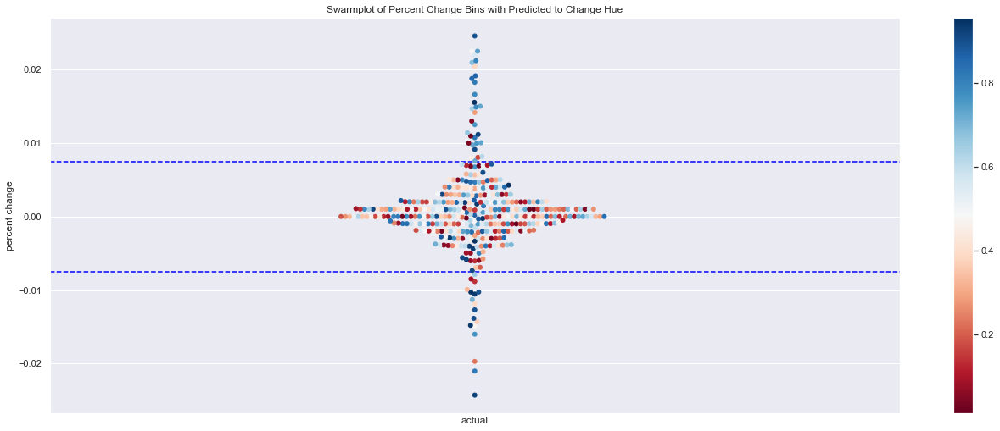

In [282]:
#### sns.set()
classifications = best_lgr_classifications
data = classifications[classifications['actual'] == 0]
fig, ax = plt.subplots(figsize=(20,8))
ax = sns.swarmplot(y="percent change", x='actual', hue="y_proba_1", palette='RdBu', data=data, size=6)
norm = plt.Normalize(classifications['y_proba_1'].min(), classifications['y_proba_1'].max())
sm = plt.cm.ScalarMappable(cmap="RdBu", norm=norm)
sm.set_array([])

# Remove the legend and add a colorbar
ax.get_legend().remove()
plt.hlines(y=0.0075, xmin=-1.0, xmax=1.0, linestyles='--', color='blue')
plt.hlines(y=-0.0075, xmin=-1.0, xmax=1.0, linestyles='--', color='blue')
ax.figure.colorbar(sm)
plt.title('Swarmplot of Percent Change Bins with Predicted to Change Hue')
plt.xticks(ticks=[])
plt.savefig('./figures/modeling/swarmplot_pred_0.png', bbox_inches='tight', transparent=True)
plt.show()

In [283]:
chi2_sig(df, bin_name, numerical_feat, 'cleaned')

Statistically Significant Words Per Bin
P_val = 0.95

# move:
  . selected features: 12
  . top features: conversation,blow,bubble,breathtake,rocketpowered,aha,promise,burden,whitehouse,scenery
 
# stay:
  . selected features: 12
  . top features: conversation,blow,bubble,breathtake,rocketpowered,aha,promise,burden,whitehouse,scenery
 
Statistically Significant Features Per Bin
P_val = 0.95

# move:
  . selected features: 8
  . top features: photos,number of tweets,video,urls,number of verbs,hashtags,number of nouns,number of stopwords
 
# stay:
  . selected features: 8
  . top features: photos,number of tweets,video,urls,number of verbs,hashtags,number of nouns,number of stopwords
 
